# This code will provide the result of the report.

# 0. Import + Load the data + Graphs generation

In [ ]:
# Initialisation et importation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
from dataloader import DataLoader
from graph_builder import GraphBuilder
from visualizations import GraphPlotter
from AE_class_distance import SignalAutoEncoder
#from graph_analyzer import GraphAnalyzer
print("importation done")

import os

# Chemin de base
path_base = r"C:\Users\zehav\OneDrive\Bureau\ENS\S5_ARIA\stage_3mois_graph\Projet_github_final"

# Génération des chemins en fonction de path_base
path_train = os.path.join(path_base, "dataset", "train.csv")
path_test = os.path.join(path_base, "dataset", "test.csv")

L_path_to_W = [
    os.path.join(path_base, "examples_graph", "correlation", "W.txt"),
    os.path.join(path_base, "examples_graph", "distsplines", "W.txt"),
    os.path.join(path_base, "examples_graph", "distsplines2", "W.txt"),
    os.path.join(path_base, "examples_graph", "dtw", "W.txt"),
    os.path.join(path_base, "examples_graph", "gl3sr", "W.txt"),
    os.path.join(path_base, "examples_graph", "precision", "W.txt"),
    os.path.join(path_base, "examples_graph", "space", "W.txt")
]

# Affichage pour vérification
print("Chemin train :", path_train)
print("Chemin test :", path_test)
print("Chemins W :")
for path in L_path_to_W:
    print(path)


df_pos = pd.DataFrame(
    {'VILLE': ['LILLE', 'ROUEN', 'PARIS', 'STRASBOURG', 'BREST', 'NANTES', 'ORLEANS', 'DIJON', 'BORDEAUX', 'LYON',
              'TOULOUSE', 'MARSEILLE'],
    'LATITUDE': [50.6365654, 49.4404591, 48.862725, 48.584614, 
                 48.3905283, 47.2186371, 47.9027336, 47.3215806, 
                 44.841225, 45.7578137, 43.6044622, 43.2961743],
    'LONGITUDE': [3.0635282, 1.0939658, 2.287592, 7.7507127, 
                  -4.4860088, -1.5541362, 1.9086066, 5.0414701, 
                  -0.5800364, 4.8320114, 1.4442469, 5.3699525],
    'REGION': ['Hauts_de_France', 'Normandie', 'Ile_de_France', 'Grand_Est', 'Bretagne', 'Pays_de_la_Loire', 
                'Centre_Val_de_Loire', 'Bourgogne_Franche_Comte', 'Nouvelle_Aquitaine', 'Auvergne_Rhone_Alpes', 
                'Occitanie', 'Provence_Alpes_Cote_d_Azur'],
    'SUPERFICIE_REGION': [31813, 29906, 12011, 57433, 27208, 32082, 39151, 47784, 83809, 69711, 72724, 31400],
    'POPULATION_REGION': [5987172, 3307286, 12395148, 5542094, 3402932, 3873096, 2564915, 2785393, 6081985,
                          8153233, 6053548, 5131187]
    })
data = DataLoader(path_train, path_test, kwargs={"start_date": "2018-01-01", "end_date": None})





In [199]:
%load_ext autoreload
%autoreload 2
from graph_builder import GraphBuilder
# Test the GraphBuilder class
LdictGraphs = []
for n in range(len(L_path_to_W)) :
    dictGraphs = {}

    #for i in range(len(L_path_to_W)):
    for i in range(10000) :
        Graph = GraphBuilder(L_path_to_W[n], test=True, **df_pos)
        W = Graph.W
        dictGraphs["Graphs"+str(i)] = Graph
    LdictGraphs.append(dictGraphs)


    
LdictGraphs_vrai = []
dictGraphs = {}
for n in range(len(L_path_to_W)) :
    Graph = GraphBuilder(L_path_to_W[n], test=False, **df_pos)
    W = Graph.W 
    dictGraphs["Graphs" + str(n)] = Graph
    
LdictGraphs_vrai.append(dictGraphs)
    
    
    
#signals = get_signals(data.nodes_dataframe, "temp", 1000)
#plot_signals(signals)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 1. Plot introduction and context

In this part we have to plot, one exemple of graph on map and all type of signals of our dataset. (load, temp, wind, nebu, TempMin, Tempmax)

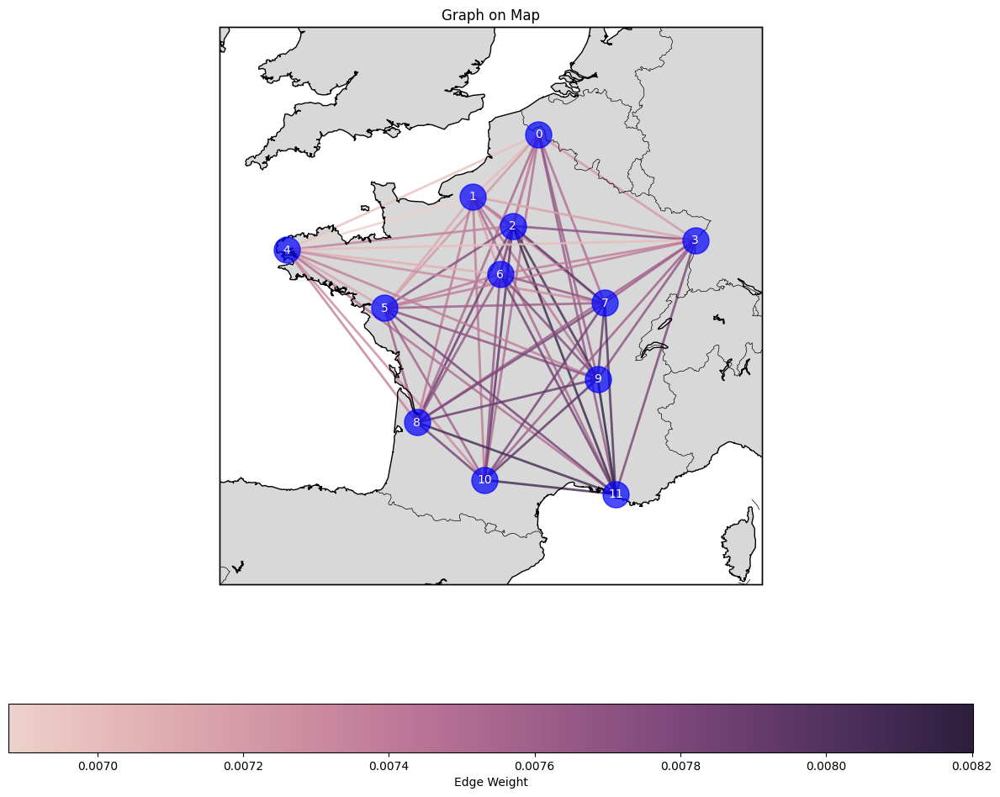

In [6]:
#Plot a graph on map
Graph = GraphBuilder(L_path_to_W[0], test=False, **df_pos)
W = Graph.W
plotter = GraphPlotter(W, df_pos)
#plotter.plot_graph(title="Graph", figsize=(10, 8))
plotter.plot_graph_on_map(title="Graph on Map")

C:\Users\zehav\AppData\Local\Temp\ipykernel_25840\1631323332.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap, num_signals)


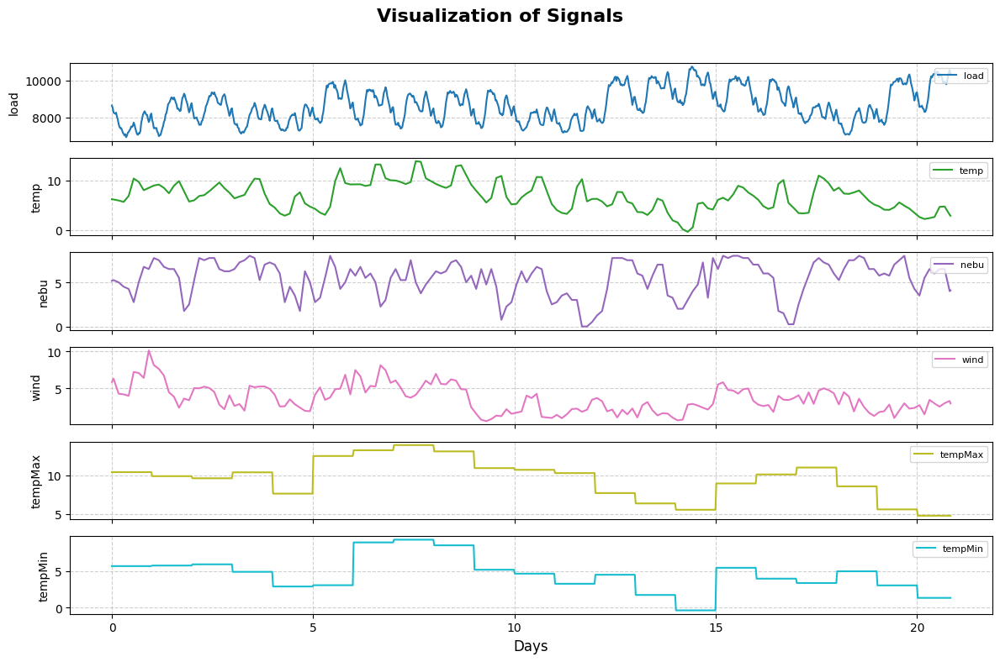

In [15]:
import matplotlib.cm as cm
# Plot every kind of signals 
Ltype_signals = ["load","temp","nebu","wind","tempMax","tempMin"]
Nsize = 1000
def get_signals(nodes_features, name_column, Nsize, row = 0):    
    """__summary__ : This function is used to extract the signals of the node over the time from the dataframe"""

    signals = [] 
    for key in nodes_features.keys():
        signals.append(nodes_features[key][name_column][row: row + Nsize])
    signals_array =np.array(signals, dtype=float)
    
    # #Normalization of the signal
    # signals_mean = np.zeros(signals_array.shape[0])
    # signals_std = np.zeros(signals_array.shape[0])
    # for i in range(signals_array.shape[0]):
    #     signals_mean[i] = np.mean(signals_array[i,:])
    #     signals_std[i] = np.std(signals_array[i,:])
    #     signals_array[i,:] = (signals_array[i,:] - signals_mean[i]) / signals_std[i]
    
    return signals_array 

# Configuration pour les plots
def plot_signals_with_colors(all_signals, signal_names, figsize=(12, 8), colormap="tab10"):
    """
    Trace chaque signal dans un subplot séparé avec des couleurs différentes.
    
    Parameters:
        - all_signals (list): Liste des signaux (tableaux 1D).
        - signal_names (list): Liste des noms des signaux.
        - figsize (tuple): Taille de la figure.
        - colormap (str): Nom du colormap pour les couleurs.
    """
    num_signals = len(all_signals)
    
    # Génération des couleurs depuis le colormap choisi
    cmap = cm.get_cmap(colormap, num_signals)
    colors = [cmap(i) for i in range(num_signals)]
    
    # Création de la figure
    fig, axs = plt.subplots(num_signals, 1, figsize=figsize, sharex=True)
    fig.suptitle("Visualization of Signals", fontsize=16, fontweight='bold')
    
    t = np.linspace(0, all_signals[0].shape[0]/48, all_signals[0].shape[0])
    # Plot chaque signal avec sa couleur
    for i, signal in enumerate(all_signals):
        ax = axs[i] if num_signals > 1 else axs  # Support pour un seul signal
        ax.plot(t,signal, label=signal_names[i], color=colors[i], linewidth=1.5)
        ax.set_ylabel(signal_names[i], fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.6)
        ax.legend(loc="upper right", fontsize=8)
    
    # Configuration de l'axe x partagé
    axs[-1].set_xlabel("Days", fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Ajuste pour ne pas chevaucher le titre
    plt.show()

all_signals = []
for i in range(len(Ltype_signals)):
    signals = get_signals(data.nodes_dataframe, Ltype_signals[i], Nsize)
    all_signals.append(signals[0,:])


# Appel de la fonction
plot_signals_with_colors(all_signals, Ltype_signals)

# Vérification Du code avec des Graphes usuelles et des signaux synthétiques

In [70]:
def generer_signal_aleatoire(type_signal="sinusoidal", frequence=5, amplitude=1.0,rand=0.1, bruit=0.0, nsize=1000, nnodes = 12, Fe=48):
        """
        Génère un signal aléatoire et le trace.
        
        Paramètres :
        - type_signal : str, type du signal ("sinusoidal", "carre", "bruit_blanc")
        - duree : float, durée du signal en secondes
        - frequence : float, fréquence du signal (pour sinus et carré uniquement)
        - amplitude : float, amplitude maximale du signal
        - bruit : float, amplitude du bruit blanc ajouté
        - taux_echantillonnage : int, nombre d'échantillons par seconde

        Retourne :
        - t : vecteur temps
        - signal : signal généré
        """
        t = np.linspace(0, nsize/Fe, nsize)
        signals = np.zeros((nnodes,nsize))
        if type_signal == "sinusoidal":
            for i in range(nnodes):
                e = random.uniform(-rand, rand)
                phi =2*np.pi *random.uniform(-rand, rand)
                signals[i, :] = amplitude * np.sin(2 * np.pi * (frequence + e) * t+phi)
                
        elif type_signal == "2sin":
            for i in range(nnodes):
                e = random.uniform(-rand, rand)
                eamp = random.uniform(-rand, rand)
                phi =2*np.pi *random.uniform(-rand, rand)
                e2 = random.uniform(-rand, rand)
                eamp2 = random.uniform(-rand, rand)
                phi2 =2*np.pi *random.uniform(-rand, rand)
                signals[i, :] = (amplitude+eamp) * np.sin(2 * np.pi * (frequence + e) * t+phi)+ (amplitude+eamp2) * np.sin(2 * np.pi * (frequence + e2) * t+phi2)
        elif type_signal == "sin + trend":
            for i in range (nnodes) : 
                e = random.uniform(-rand, rand)
                eamp = random.uniform(-rand, rand)
                phi =2*np.pi *random.uniform(-rand, rand)
                e2 = random.uniform(-rand, rand)
                eamp2 = random.uniform(-rand, rand)
                phi2 =2*np.pi *random.uniform(-rand, rand)
                a1 = random.uniform(-rand*1e-1, rand*1e-1)
                a2 = random.uniform(-rand*1e-1, rand*1e-1)
                signals[i, :] = (amplitude+eamp) * np.sin(2 * np.pi * (frequence + e) * t+phi)+ (amplitude+eamp2) * np.sin(2 * np.pi * (frequence + e2) * t+phi2) +a1*t+a2*t**2
                e = random.uniform(-rand, rand)
                eamp = random.uniform(-rand, rand)
                phi =2*np.pi *random.uniform(-rand, rand)
                e2 = random.uniform(-rand, rand)
                eamp2 = random.uniform(-rand, rand)
                phi2 =2*np.pi *random.uniform(-rand, rand)
                signals[i, :] += (amplitude+eamp) * np.sin(2 * np.pi * (frequence + e) * t+phi)+ (amplitude+eamp2) * np.sin(2 * np.pi * (frequence + e2) * t+phi2)
        elif type_signal == "carre":
            for i in range(nnodes):
                signals[i, :] = amplitude * np.sign(np.sin(2 * np.pi * frequence * t))
        
        elif type_signal == "bruit_blanc":
            for i in range(nnodes):
                signals[i, :] = amplitude * np.random.normal(0, 1, len(t))
        elif type_signal == "affine":
            for i in range(nnodes):
                signals[i, :] =  amplitude * (t+i)
        else:
            raise ValueError("Type de signal non reconnu. Utilisez 'sinusoidal', 'carre' ou 'bruit_blanc'.")
        
        # Ajout de bruit si demandé
        if bruit > 0:
            signals += bruit * np.random.normal(0, 1, len(t))
        
        signals_normalized = (signals - np.mean(signals)) / np.std(signals)
        # for i in range(nnodes):
        #     # Tracé du signal
        #     plt.figure(figsize=(10, 4))
        #     plt.plot(t, signals_normalized[i, :])
        #     plt.title(f"Signal {type_signal} - Fréquence: {frequence} Hz")
        #     plt.xlabel("Temps (s)")
        #     plt.ylabel("Amplitude")
        #     plt.grid(True)
        #     plt.show()
        
        return signals_normalized

signals_test = generer_signal_aleatoire(type_signal="sinusoidal", frequence=0.5, amplitude=1.0,rand=0.01, bruit=0.0, nsize=1000, nnodes = 12, Fe=48)

# 3. Test of the scalar analyser 

## 3.4.1 plot features with gaussian noise for 100 graphes 

In [99]:
def generer_signal_aleatoire(type_signal="sinusoidal", frequence=5, amplitude=1.0,rand=0.1, bruit=0.0, nsize=1000, nnodes = 12, Fe=48):
    """
    Génère un signal aléatoire et le trace.
    
    Paramètres :
    - type_signal : str, type du signal ("sinusoidal", "carre", "bruit_blanc")
    - duree : float, durée du signal en secondes
    - frequence : float, fréquence du signal (pour sinus et carré uniquement)
    - amplitude : float, amplitude maximale du signal
    - bruit : float, amplitude du bruit blanc ajouté
    - taux_echantillonnage : int, nombre d'échantillons par seconde

    Retourne :
    - t : vecteur temps
    - signal : signal généré
    """
    t = np.linspace(0, nsize/Fe, nsize)
    signals = np.zeros((nnodes,nsize))
    if type_signal == "sinusoidal":
        for i in range(nnodes):
            e = random.uniform(-rand, rand)
            phi =2*np.pi *random.uniform(-rand, rand)
            signals[i, :] = amplitude * np.sin(2 * np.pi * (frequence + e) * t+phi)
            
    elif type_signal == "2sin":
        for i in range(nnodes):
            e = random.uniform(-rand, rand)
            eamp = random.uniform(-rand, rand)
            phi =2*np.pi *random.uniform(-rand, rand)
            e2 = random.uniform(-rand, rand)
            eamp2 = random.uniform(-rand, rand)
            phi2 =2*np.pi *random.uniform(-rand, rand)
            signals[i, :] = (amplitude+eamp) * np.sin(2 * np.pi * (frequence + e) * t+phi)+ (amplitude+eamp2) * np.sin(2 * np.pi * (frequence + e2) * t+phi2)
    elif type_signal == "sin + trend":
        for i in range (nnodes) : 
            e = random.uniform(-rand, rand)
            eamp = random.uniform(-rand, rand)
            phi =2*np.pi *random.uniform(-rand, rand)
            e2 = random.uniform(-rand, rand)
            eamp2 = random.uniform(-rand, rand)
            phi2 =2*np.pi *random.uniform(-rand, rand)
            a1 = random.uniform(-rand*1e-1, rand*1e-1)
            a2 = random.uniform(-rand*1e-1, rand*1e-1)
            signals[i, :] = (amplitude+eamp) * np.sin(2 * np.pi * (frequence + e) * t+phi)+ (amplitude+eamp2) * np.sin(2 * np.pi * (frequence + e2) * t+phi2) +a1*t+a2*t**2
            e = random.uniform(-rand, rand)
            eamp = random.uniform(-rand, rand)
            phi =2*np.pi *random.uniform(-rand, rand)
            e2 = random.uniform(-rand, rand)
            eamp2 = random.uniform(-rand, rand)
            phi2 =2*np.pi *random.uniform(-rand, rand)
            signals[i, :] += (amplitude+eamp) * np.sin(2 * np.pi * (frequence + e) * t+phi)+ (amplitude+eamp2) * np.sin(2 * np.pi * (frequence + e2) * t+phi2)
    elif type_signal == "carre":
        for i in range(nnodes):
            signals[i, :] = amplitude * np.sign(np.sin(2 * np.pi * frequence * t))
    
    elif type_signal == "bruit_blanc":
        for i in range(nnodes):
            signals[i, :] = amplitude * np.random.normal(0, 1, len(t))
    elif type_signal == "affine":
        for i in range(nnodes):
            signals[i, :] =  amplitude * (t+i)
    else:
        raise ValueError("Type de signal non reconnu. Utilisez 'sinusoidal', 'carre' ou 'bruit_blanc'.")
    
    # Ajout de bruit si demandé
    if bruit > 0:
        signals += bruit * np.random.normal(0, 1, len(t))
    
    signals_normalized = (signals - np.mean(signals)) / np.std(signals)
    # for i in range(nnodes):
    #     # Tracé du signal
    #     plt.figure(figsize=(10, 4))
    #     plt.plot(t, signals_normalized[i, :])
    #     plt.title(f"Signal {type_signal} - Fréquence: {frequence} Hz")
    #     plt.xlabel("Temps (s)")
    #     plt.ylabel("Amplitude")
    #     plt.grid(True)
    #     plt.show()
    
    return signals_normalized

signals_test = generer_signal_aleatoire(type_signal="bruit_blanc", frequence=0.5, amplitude=1.0,rand=0.01, bruit=0.0, nsize=1000, nnodes = 12, Fe=48)

In [100]:
#Génération of 100 random graphs
dictGraphs = {}
for i in range(300) :
    Graph = GraphBuilder(L_path_to_W[0], test=True, **df_pos)
    W = Graph.W
    dictGraphs["Graphs"+str(i)] = Graph

LdictGraphs= [dictGraphs]

In [101]:
%load_ext autoreload
%autoreload 2
from graph_scalar_analyzer import GraphScalarAnalyzer
from tqdm import tqdm

nodes_features = data.nodes_dataframe
name_column = "load"
row = 0
plot_curv = False
def calcul_dictfeatures(LdictGraphs, nodes_features = data.nodes_dataframe, name_column = "load", row = 0,Nsize= 48, plot_curv = False, test = False ,signals_test=None, Fast = False):
    dictfeaturesGraphs = {}
    indexdict = 0
    for dictGraphs in LdictGraphs:
        Lmean_smoothness = []
        Lmean_bandwidth = []
        Lstd_smoothness = []
        Lstd_bandwidth = []
        # Test the GraphScalarAnalyzer class
        for i in tqdm(range(len(dictGraphs))):
            #Calculating the features of the graph over the time
            Lsmoothness = []
            Lbandwidth = []
            Lstdsmoothness = []
            Lstdbandwidth = []
            for t in range(Nsize) :
                #print(dictGraphs["Graphs" + str(i)].W)
                graph_scalar = GraphScalarAnalyzer(dictGraphs["Graphs" + str(i)] , nodes_features, name_column, t+row ,test = test, signals_test=signals_test, Fast =Fast, **df_pos)
                Lsmoothness.append(graph_scalar.smoothness)
                Lbandwidth.append(graph_scalar.bandwidth_general)
                Lstdsmoothness.append(graph_scalar.std_smoothness)
                Lstdbandwidth.append(graph_scalar.std_bandwidth)
            x = np.linspace(0, len(Lsmoothness)/48, len(Lsmoothness))
            if plot_curv :
                # Creation of the subplot
                fig, axs = plt.subplots(2, 1, figsize=(10, 8))  

                #the smoothness of the graph
                axs[0].plot(x, Lsmoothness, color='mediumblue', label='Smoothness Graph')
                axs[0].fill_between(x, 
                                    np.array(Lsmoothness) - np.array(Lstdsmoothness), 
                                    np.array(Lsmoothness) + np.array(Lstdsmoothness), 
                                    color='lightskyblue', 
                                    alpha=0.4, 
                                    label='Écart-type (smoothness)')

                axs[0].set_title('Smoothness of the Graph'+str(i))
                axs[0].set_xlabel('days')
                axs[0].set_ylabel('Smoothness')
                axs[0].set_ylim(0, 2)
                axs[0].legend()
                axs[0].grid(True, linestyle='--', alpha=0.6)  

                #the bandwidth of the graph
                axs[1].plot(x, Lbandwidth, color='green', label='Bandwidth Graph')
                axs[1].fill_between(x, 
                                    np.array(Lbandwidth) - np.array(Lstdbandwidth), 
                                    np.array(Lbandwidth) + np.array(Lstdbandwidth), 
                                    color='palegreen', 
                                    alpha=0.4, 
                                    label='Écart-type (bandwidth)')

                axs[1].set_title('Bandwidth of the Graph'+str(i))
                axs[1].set_xlabel('days')
                axs[1].set_ylabel('Bandwidth')
                axs[1].set_ylim(0, 0.5)
                axs[1].legend()
                axs[1].grid(True, linestyle='--', alpha=0.6) 


                plt.tight_layout()
                plt.show()
            
            Lmean_smoothness.append(np.mean(Lsmoothness))
            Lmean_bandwidth.append(np.mean(Lbandwidth))
            Lstd_smoothness.append(np.mean(Lstdsmoothness))
            Lstd_bandwidth.append(np.mean(Lstdbandwidth))

        # conversion in arrays
        Lmean_smoothness = np.array(Lmean_smoothness)
        Lmean_bandwidth = np.array(Lmean_bandwidth)
        Lstd_smoothness = np.array(Lstd_smoothness)
        Lstd_bandwidth = np.array(Lstd_bandwidth)

        x_smoothness = np.arange(len(Lmean_smoothness))
        x_bandwidth = np.arange(len(Lmean_bandwidth))

        fig, axs = plt.subplots(2, 1, figsize=(10, 12))

        axs[0].scatter(x_smoothness, Lmean_smoothness, color='mediumblue', label='Points', s=100)
        axs[0].errorbar(x_smoothness, Lmean_smoothness, yerr=Lstd_smoothness, fmt='o', color='mediumblue', ecolor='lightskyblue', elinewidth=2, capsize=5, label='Écart-type')
        #axs[0].fill_between(x_smoothness, Lmean_smoothness - Lstd_smoothness, Lmean_smoothness + Lstd_smoothness, color='lightskyblue', alpha=0.4, label='Zone de l’écart-type')
        axs[0].set_title('Average Smoothness with std of each graph')
        axs[0].set_xlabel('Graph index')
        axs[0].set_ylabel('Smoothness')
        y_min_smoothness = min(Lmean_smoothness - Lstd_smoothness) - 0.05
        y_max_smoothness = max(Lmean_smoothness + Lstd_smoothness) + 0.05
        axs[0].set_ylim(y_min_smoothness, y_max_smoothness)
        axs[0].grid(True, linestyle='--', alpha=0.6)
        axs[0].legend()

        axs[1].scatter(x_bandwidth, Lmean_bandwidth, color='green', label='Points', s=100)
        axs[1].errorbar(x_bandwidth, Lmean_bandwidth, yerr=Lstd_bandwidth, fmt='o', color='green', ecolor='palegreen', elinewidth=2, capsize=5, label='Écart-type')
        #axs[1].fill_between(x_bandwidth, Lmean_bandwidth - Lstd_bandwidth, Lmean_bandwidth + Lstd_bandwidth, color='palegreen', alpha=0.4, label='Zone de l’écart-type')
        axs[1].set_title('Average Bandwidth with std of each graph')
        axs[1].set_xlabel('Graph index')
        axs[1].set_ylabel('Bandwidth')
        y_min_bandwidth = min(Lmean_bandwidth - Lstd_bandwidth) - 0.05
        y_max_bandwidth = max(Lmean_bandwidth + Lstd_bandwidth) + 0.05
        axs[1].set_ylim(y_min_bandwidth, y_max_bandwidth)
        axs[1].grid(True, linestyle='--', alpha=0.6)
        axs[1].legend()

        plt.tight_layout()
        plt.show()
        dictfeaturesGraphs["Graphs"+str(indexdict)] = [Lmean_smoothness, Lmean_bandwidth, Lstd_smoothness, Lstd_bandwidth]
        indexdict += 1
        print(indexdict)
    return dictfeaturesGraphs

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Plot features for gaussian noise

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


100%|██████████| 300/300 [01:11<00:00,  4.19it/s]


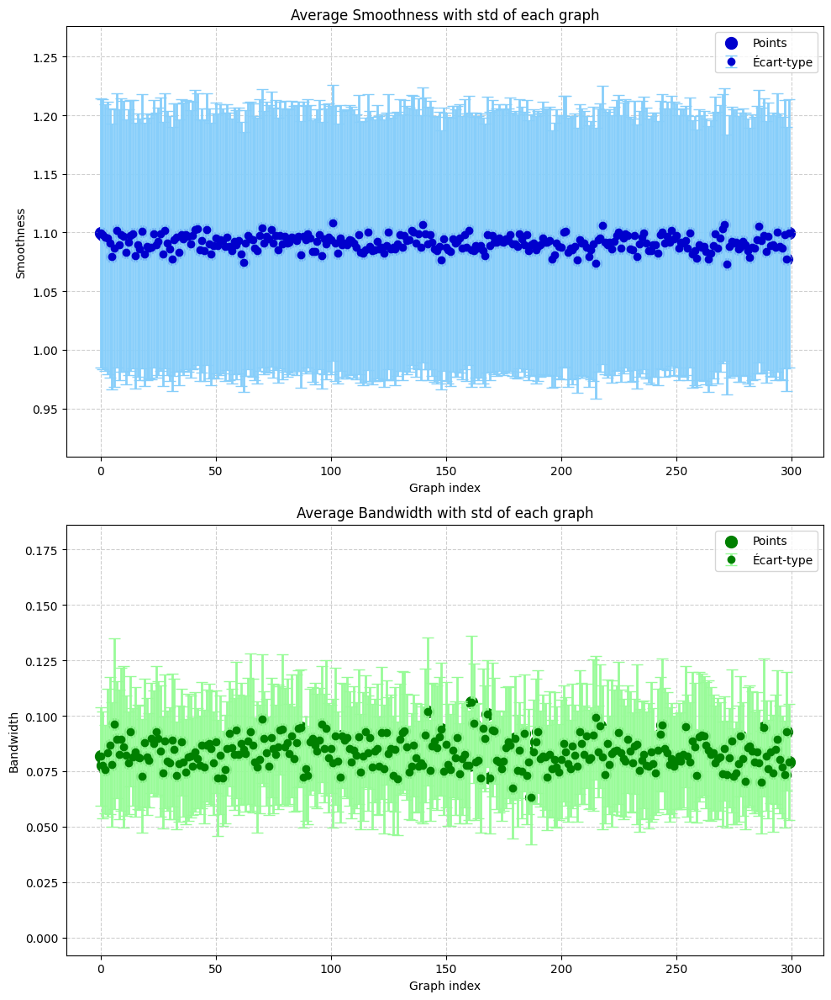

1


In [81]:
%load_ext autoreload
%autoreload 2
from graph_scalar_analyzer import GraphScalarAnalyzer
from tqdm import tqdm

nodes_features = data.nodes_dataframe
name_column = "load"
row = 0
plot_curv = False

dictfeaturesGraphs = calcul_dictfeatures(LdictGraphs, nodes_features = data.nodes_dataframe, name_column = "load", row = 0,Nsize= 100,  plot_curv = False, test = True, signals_test=signals_test, Fast = False)

### Plot distribution Features 

In [85]:
#Génération of 100 random graphs
dictGraphs = {}
for i in range(1000) :
    Graph = GraphBuilder(L_path_to_W[0], test=True, **df_pos)
    W = Graph.W
    dictGraphs["Graphs"+str(i)] = Graph

LdictGraphs= [dictGraphs]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


100%|██████████| 1000/1000 [00:44<00:00, 22.64it/s]


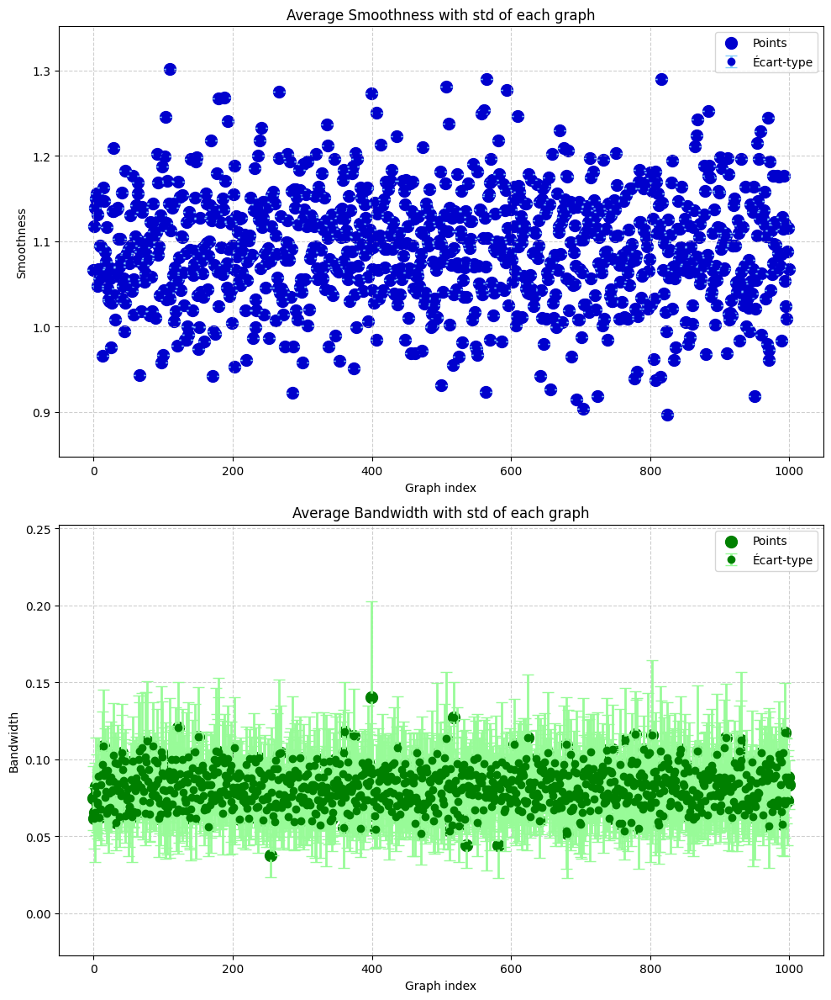

1


In [86]:
%load_ext autoreload
%autoreload 2
from graph_scalar_analyzer import GraphScalarAnalyzer
from tqdm import tqdm

nodes_features = data.nodes_dataframe
name_column = "load"
row = 0
plot_curv = False

dictfeaturesGraphs = calcul_dictfeatures(LdictGraphs, nodes_features = data.nodes_dataframe, name_column = "load", row = 0,Nsize= 100,  plot_curv = False, test = False, signals_test=signals_test, Fast = True)

[[1.06662004 1.11778383 1.13927264 1.1496398  1.15611034 1.04704196
  1.13173886 1.06749526 1.05655752 1.09445678 1.14844198 1.09410535
  1.05888158 0.96564474 1.16330528 1.14722709 1.08814458 1.0590484
  1.07572272 1.1161158  1.04484885 1.03144309 1.06927022 1.03017119
  1.05632857 0.97504975 1.02736019 1.13506003 1.20919632 1.13569061
  1.03687279 1.00783291 1.05928942 1.13722611 1.05910553 1.13890705
  1.10276829 1.07034227 1.10285938 1.07898868 1.15666588 1.03312552
  1.04696836 1.05658151 0.99395899 1.02776827 1.18250297 1.0835945
  1.08616834 1.04687142 1.09077137 1.07503036 1.07405079 1.13072861
  1.09437272 1.04129838 1.17670023 1.01370235 1.05525051 1.05114814
  1.10603011 1.14203439 1.07722106 1.1562171  1.16882858 1.10093555
  0.94255553 1.08763458 1.01802834 1.14025208 1.13448371 1.0719483
  1.09301574 1.05268551 1.06204436 1.09824539 1.08500198 1.07803403
  1.07997242 1.09896135 1.1044608  1.01338895 1.12267298 1.05855247
  1.01803052 1.14379742 1.11153447 1.1053459  1.121

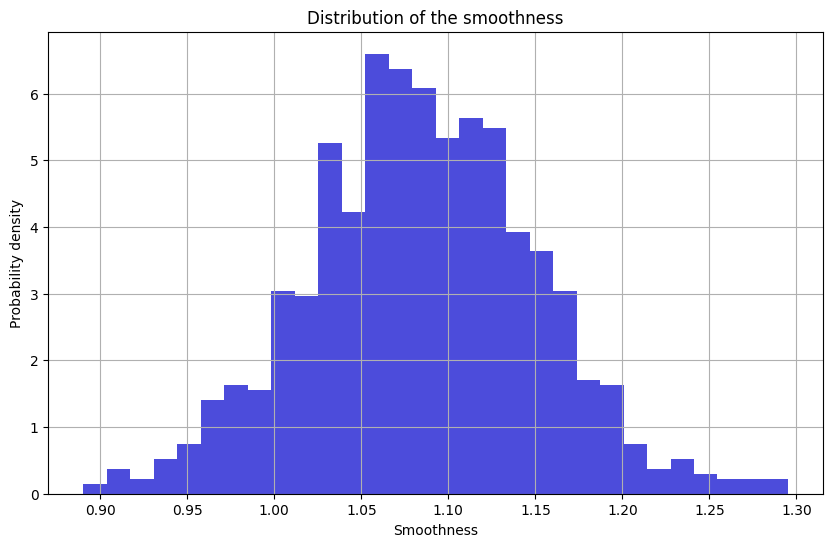

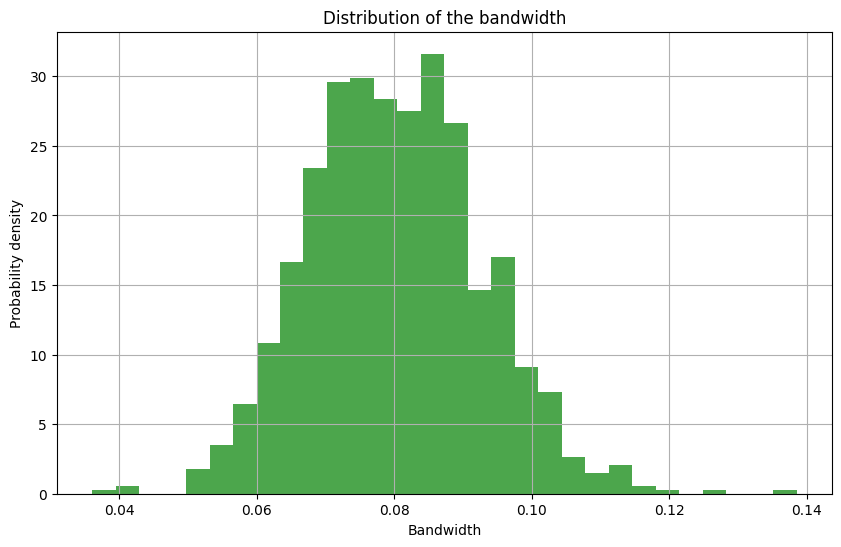

In [89]:

def distribution_calcul(L, nbrange):
    """
    Calculate the probability distribution of a list.

    Args:
    - L (list or np.array): List of values.
    - nbrange (int): Number of bins for the histogram.

    Returns:
    - Lhist (np.array): Normalized histogram of the distribution.
    - bins (np.array): Bin edges.
    """
    bins = np.linspace(min(L), max(L), nbrange + 1)
    hist, _ = np.histogram(L, bins=bins, density=True)
    return hist, bins[:-1]

def plot_distribution(Lhist, bins, title, xlabel, ylabel, color):
    """
    Plot a probability distribution as a histogram.

    Args:
    - Lhist (list or np.array): Values of the distribution.
    - bins (list or np.array): Bin edges corresponding to the distribution.
    - title (str): Title of the plot.
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - color (str): Color of the histogram.
    """
    plt.figure(figsize=(10, 6))
    plt.bar(bins, Lhist, width=(bins[1] - bins[0]), color=color, alpha=0.7)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()


nbrange = 30
Lmean_smoothness = []
Lmean_bandwidth = []
Llhist_smoothness = []
Llhist_bandwidth = []
Lbins_smoothness = []
Lbins_bandwidth = []
# We are taking back the list of the features of the graphs
for i in range(len(dictfeaturesGraphs)):
    Lmean_smoothness.append(dictfeaturesGraphs["Graphs"+str(i)][0])
    Lmean_bandwidth.append(dictfeaturesGraphs["Graphs"+str(i)][1])
    Lhist_smoothness, bins_smoothness = distribution_calcul(Lmean_smoothness[i], nbrange)
    Lhist_bandwidth, bins_bandwidth = distribution_calcul(Lmean_bandwidth[i], nbrange)
    Llhist_smoothness.append(Lhist_smoothness)
    Llhist_bandwidth.append(Lhist_bandwidth)
    Lbins_smoothness.append(bins_smoothness)
    Lbins_bandwidth.append(bins_bandwidth)
Lmean_smoothness = np.array(Lmean_smoothness)
Lmean_bandwidth = np.array(Lmean_bandwidth)
Llhist_smoothness = np.array(Llhist_smoothness)
Llhist_bandwidth = np.array(Llhist_bandwidth)
Lbins_smoothness = np.array(Lbins_smoothness)
Lbins_bandwidth = np.array(Lbins_bandwidth)

print (Lmean_smoothness)   
print(Lbins_smoothness)
plot_distribution(Lhist_smoothness,Lbins_smoothness[0], "Distribution of the smoothness", "Smoothness", "Probability density", color='mediumblue')
plot_distribution(Lhist_bandwidth,Lbins_bandwidth[0], "Distribution of the bandwidth", "Bandwidth", "Probability density", color='green')



### Plot correlation smoothness and bandwidth 

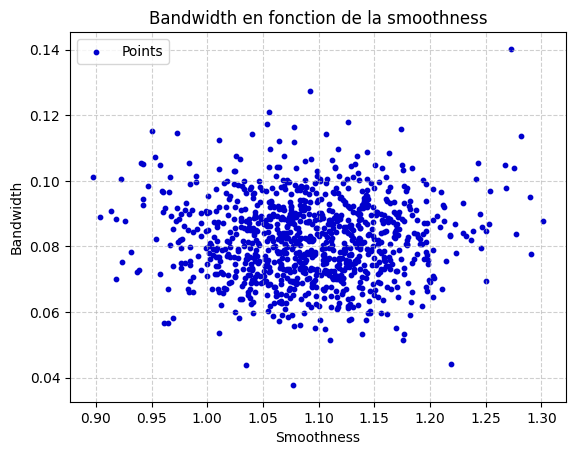

In [90]:
# affichage de la bande passante en fonction de la smoothness
def plot_correlation(Lx, Ly,xlabel, ylabel, title) : 
    plt.scatter(Lx, Ly, color='mediumblue', label='Points', s=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.show()

plot_correlation(Lmean_smoothness, Lmean_bandwidth, "Smoothness", "Bandwidth", "Bandwidth en fonction de la smoothness")

## 3.4.2 Plot results of scalar analyzer

### Plot features on 356 days

  0%|          | 0/1 [00:00<?, ?it/s]

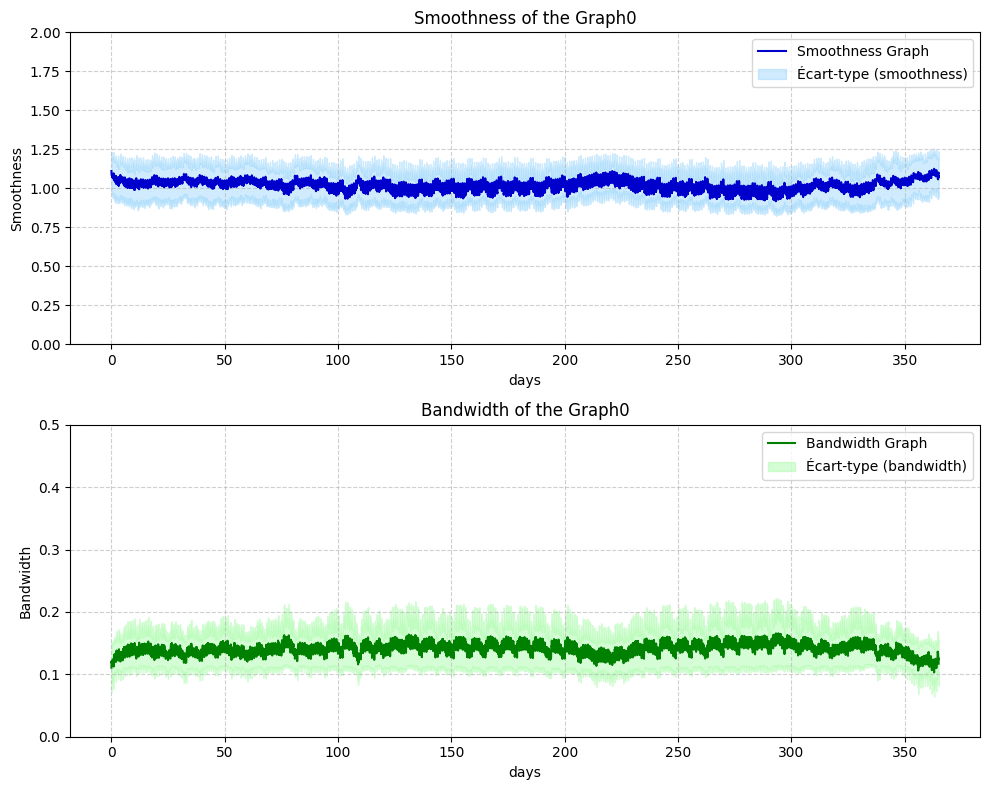

100%|██████████| 1/1 [00:43<00:00, 43.50s/it]


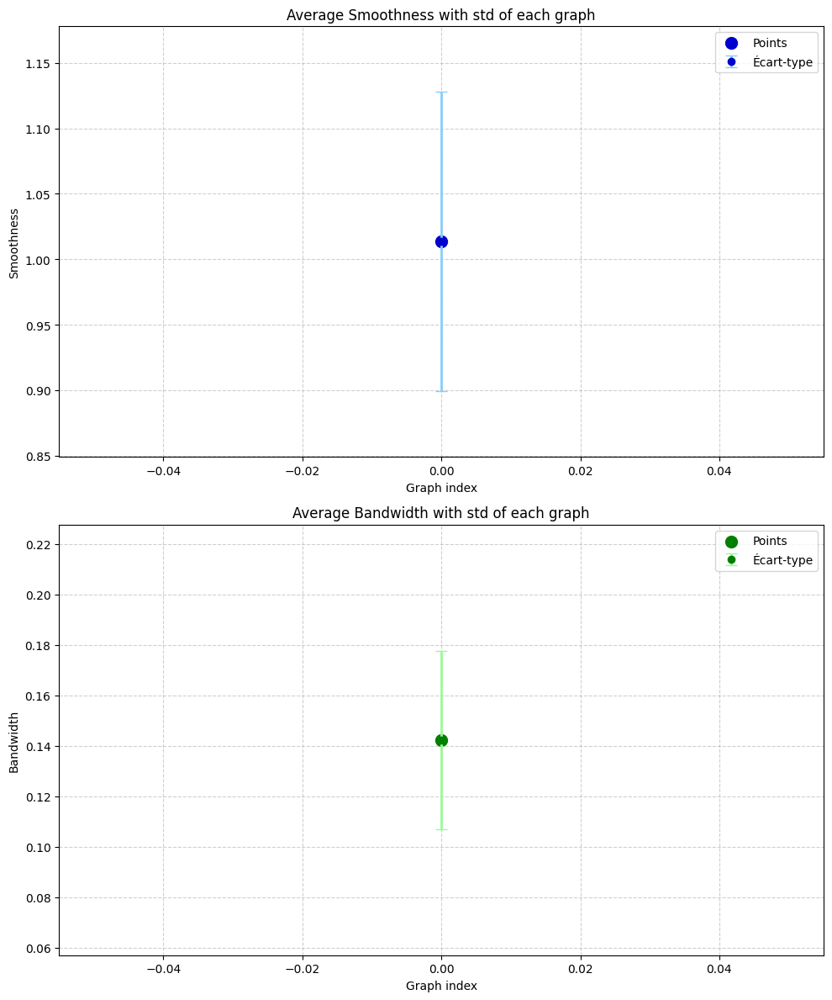

1


In [92]:
LdictGraphs_vrai = []
dictGraphs = {}
for n in range(1) :
    Graph = GraphBuilder(L_path_to_W[1], test=False, **df_pos)
    W = Graph.W 
    dictGraphs["Graphs" + str(0)] = Graph
    
LdictGraphs_vrai.append(dictGraphs)
dictfeaturesGraphs_vrai = calcul_dictfeatures(LdictGraphs_vrai, nodes_features = data.nodes_dataframe, name_column = "load", row = 0, Nsize= 48*365,  plot_curv = True, test = False, signals_test=None, Fast = False)

### Plot features on 7 days

  0%|          | 0/7 [00:00<?, ?it/s]

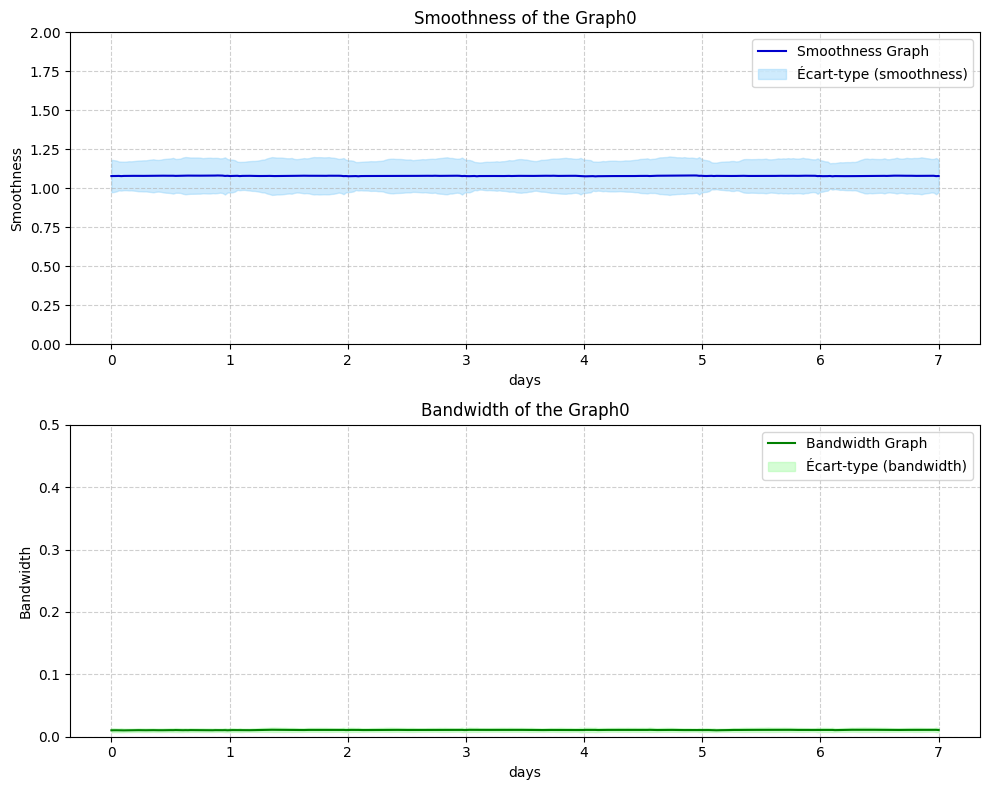

 14%|█▍        | 1/7 [00:01<00:06,  1.09s/it]

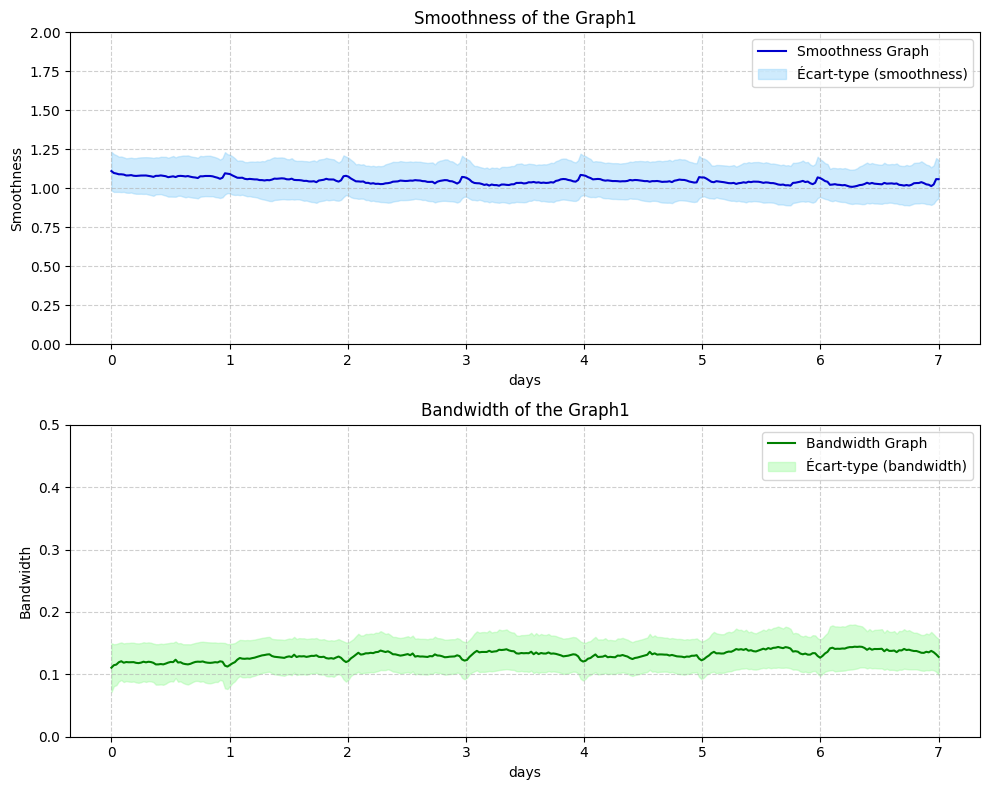

 29%|██▊       | 2/7 [00:02<00:05,  1.08s/it]

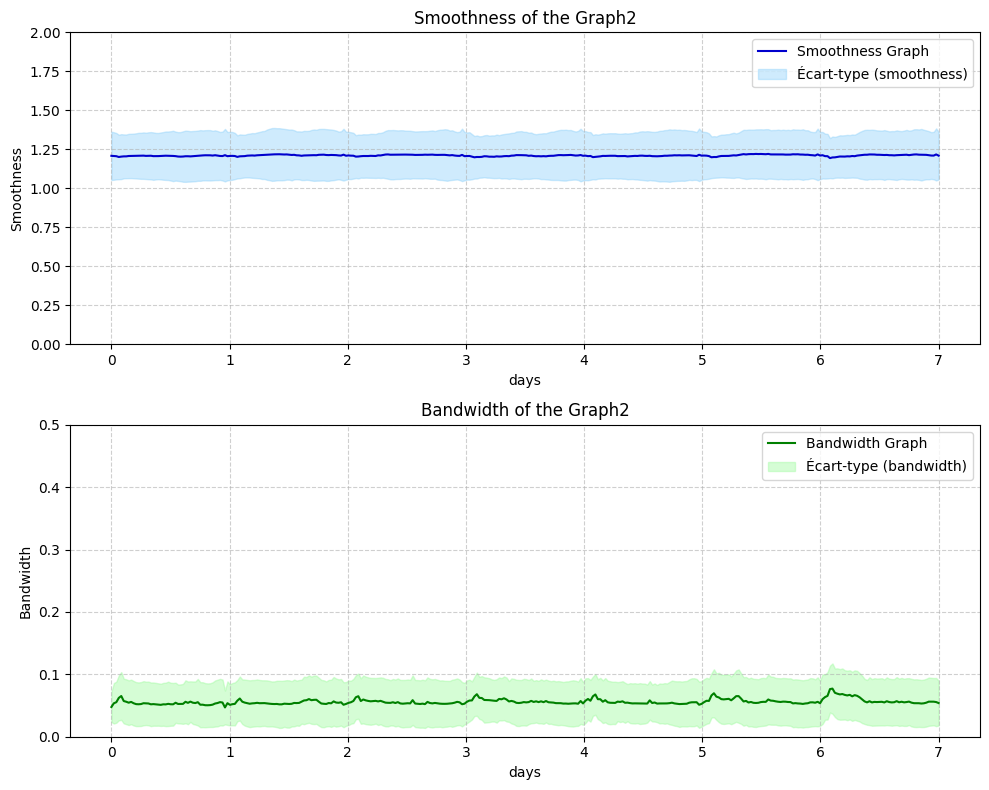

 43%|████▎     | 3/7 [00:03<00:04,  1.10s/it]

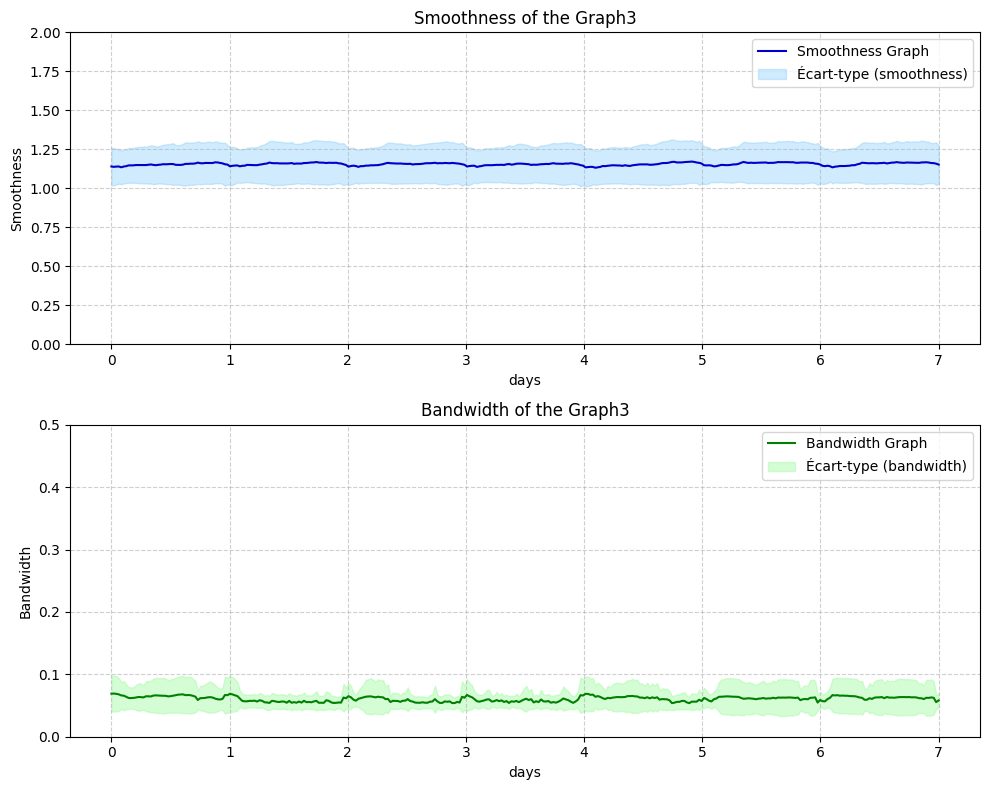

 57%|█████▋    | 4/7 [00:04<00:03,  1.04s/it]

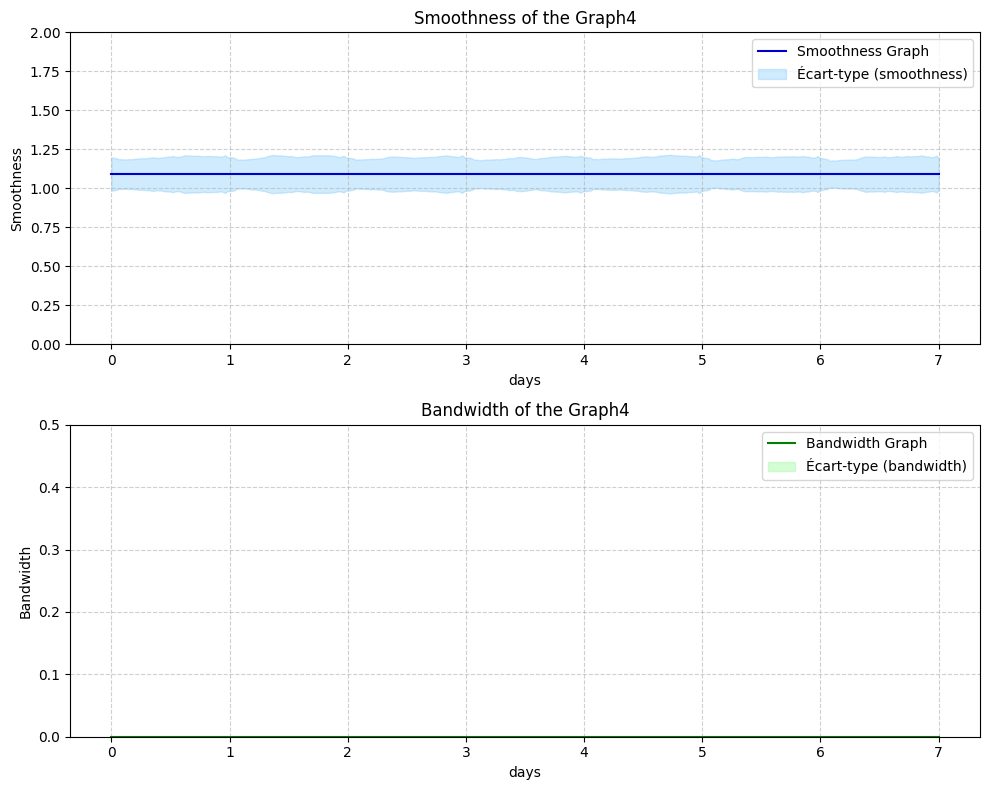

 71%|███████▏  | 5/7 [00:05<00:02,  1.06s/it]

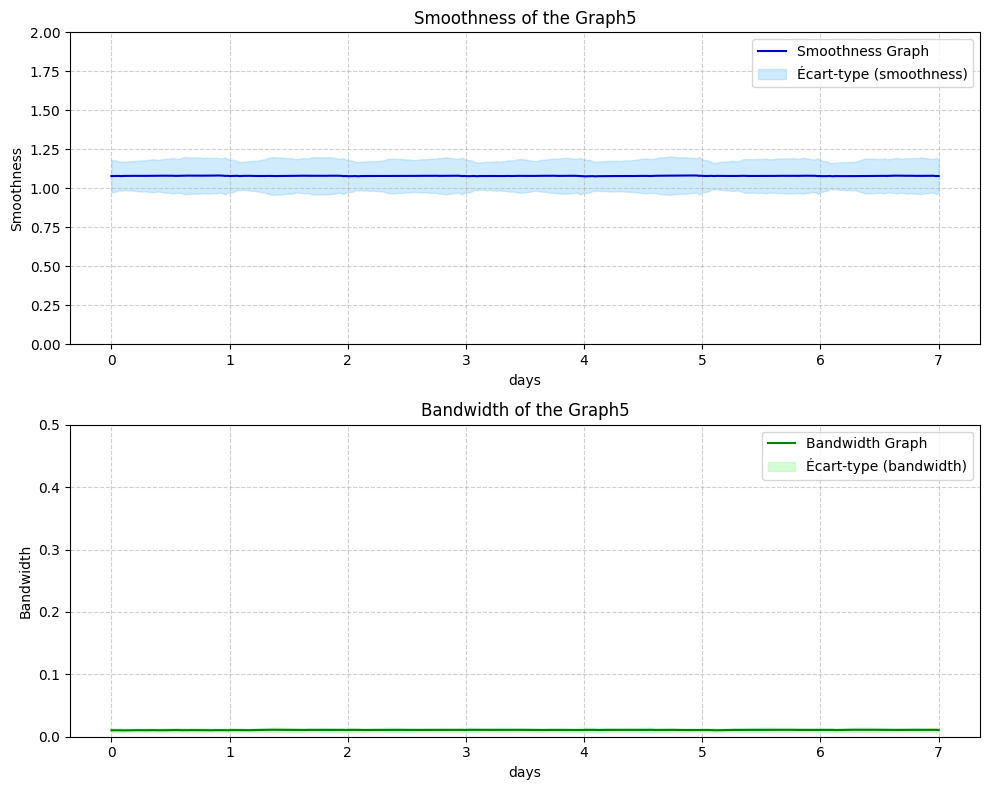

 86%|████████▌ | 6/7 [00:06<00:01,  1.09s/it]

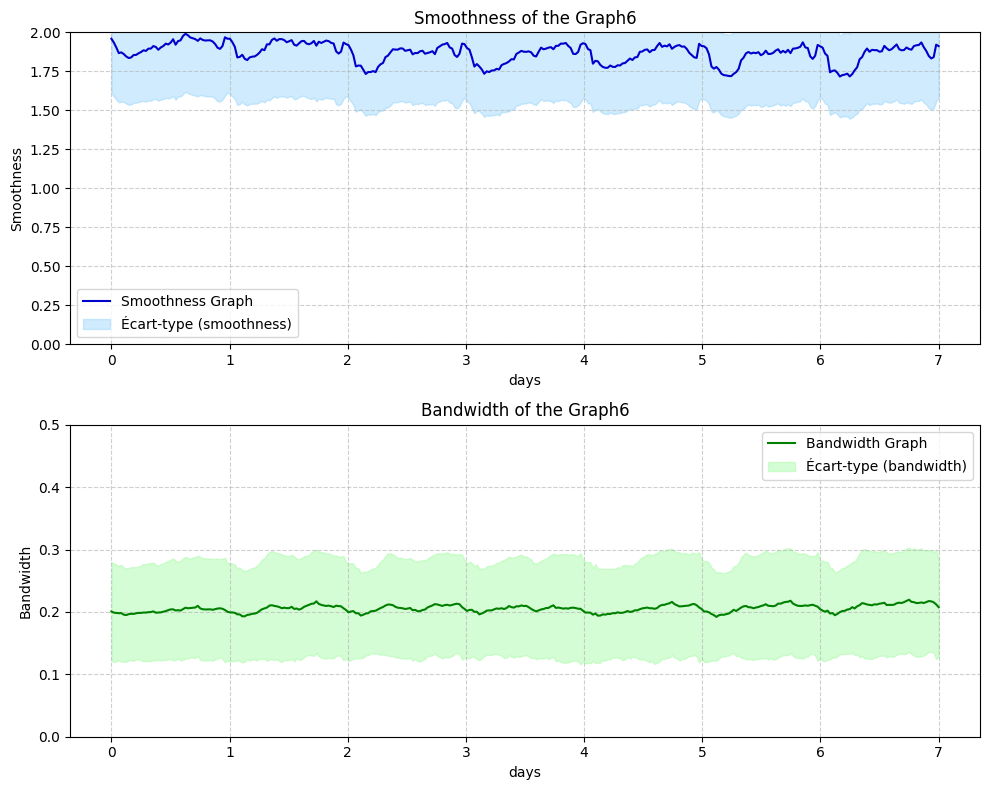

100%|██████████| 7/7 [00:07<00:00,  1.07s/it]


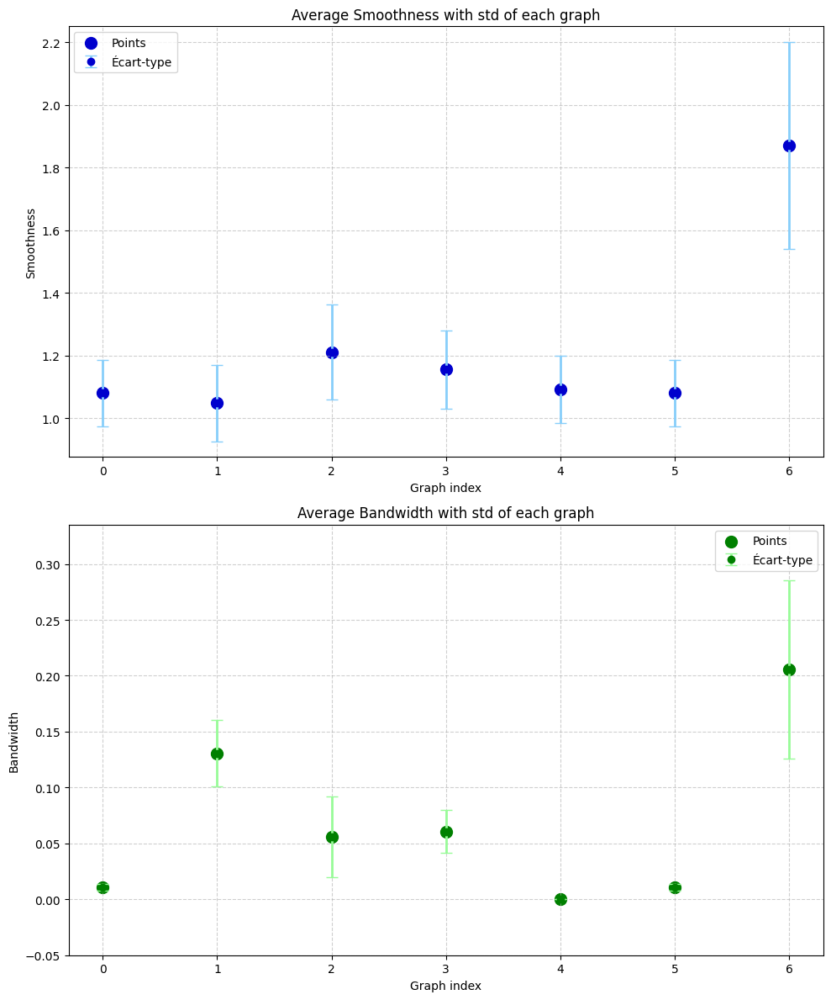

1


In [47]:
dictfeaturesGraphs_vrai = calcul_dictfeatures(LdictGraphs_vrai, nodes_features = data.nodes_dataframe, name_column = "load", row = 0, Nsize= 48*7,  plot_curv = True, test = False, signals_test=None, Fast = False)

### plot real graphs features on probability density

In [93]:
%load_ext autoreload
%autoreload 2
from graph_builder import GraphBuilder
#Genration of random graphs
LdictGraphs = []
for n in range(len(L_path_to_W)) :
    dictGraphs = {}
    for i in range(1000) :
        Graph = GraphBuilder(L_path_to_W[n], test=True, **df_pos)
        W = Graph.W
        dictGraphs["Graphs"+str(i)] = Graph
    LdictGraphs.append(dictGraphs)


    
LdictGraphs_vrai = []
dictGraphs = {}
for n in range(len(L_path_to_W)) :
    Graph = GraphBuilder(L_path_to_W[n], test=False, **df_pos)
    W = Graph.W 
    dictGraphs["Graphs" + str(n)] = Graph
    
LdictGraphs_vrai.append(dictGraphs)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


100%|██████████| 1000/1000 [00:45<00:00, 21.97it/s]


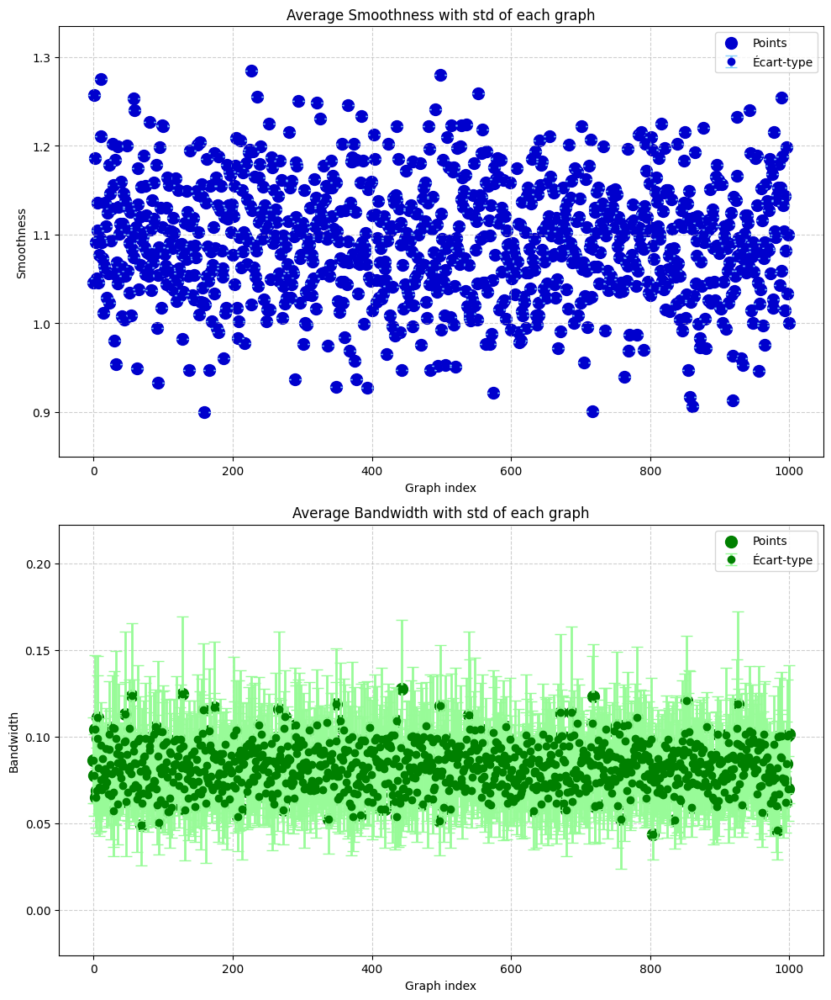

1


100%|██████████| 1000/1000 [00:47<00:00, 21.22it/s]


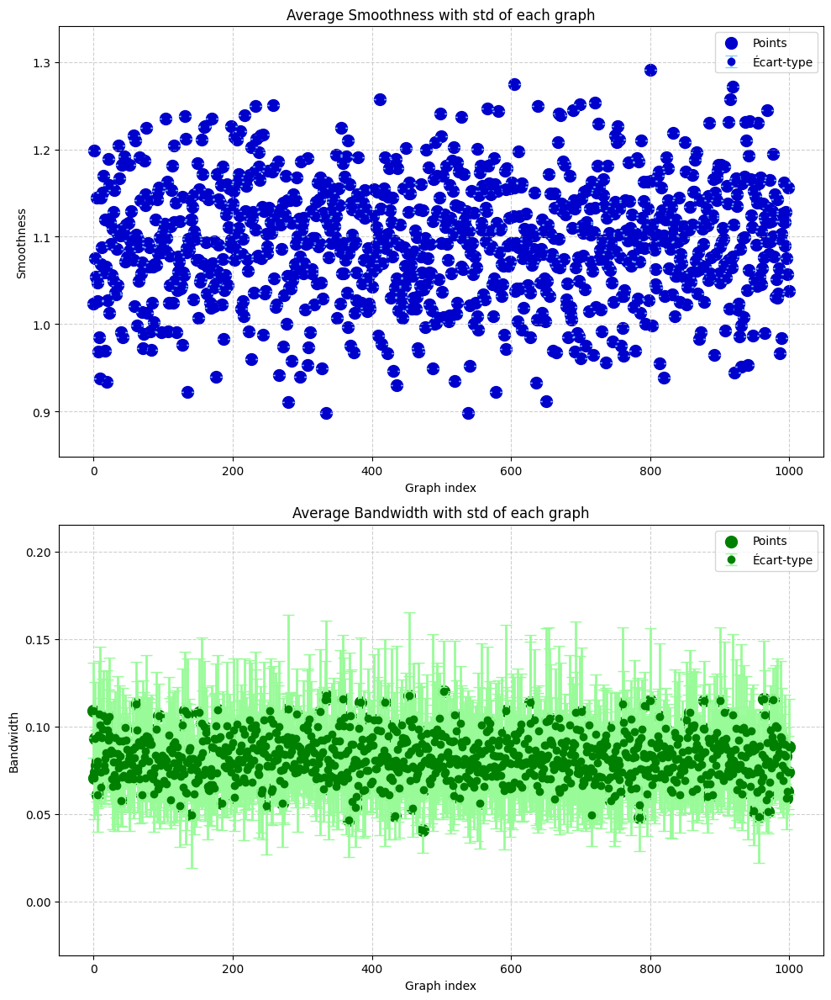

2


100%|██████████| 1000/1000 [00:45<00:00, 22.18it/s]


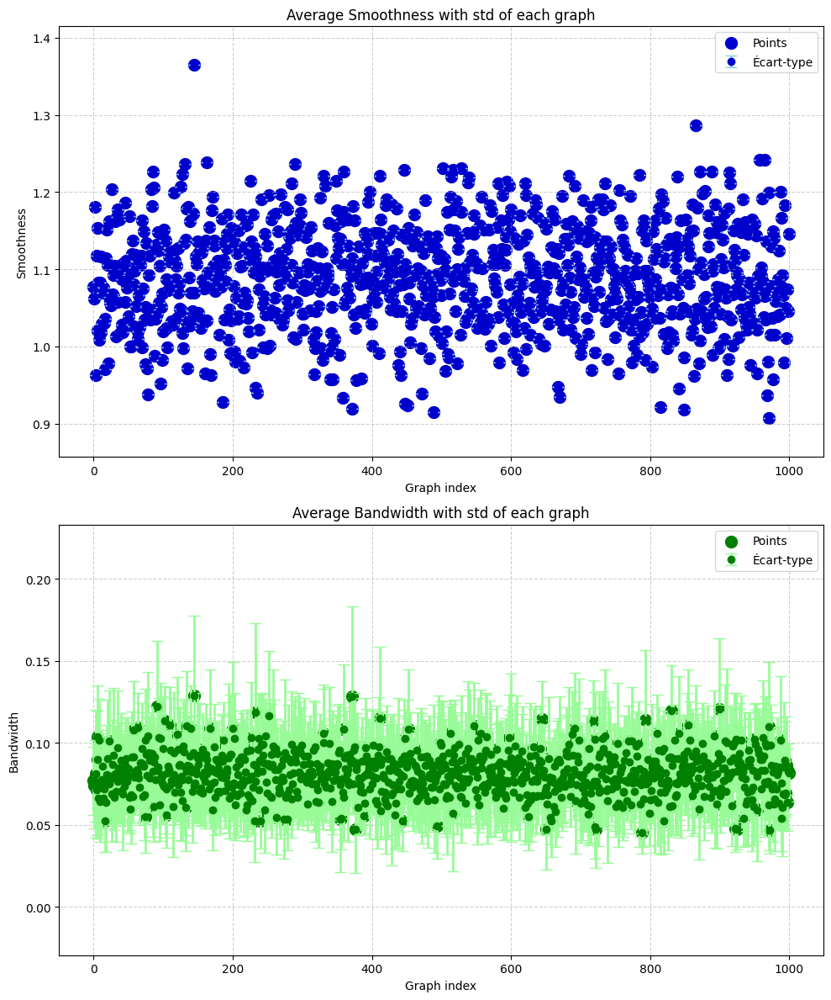

3


100%|██████████| 1000/1000 [00:47<00:00, 21.06it/s]


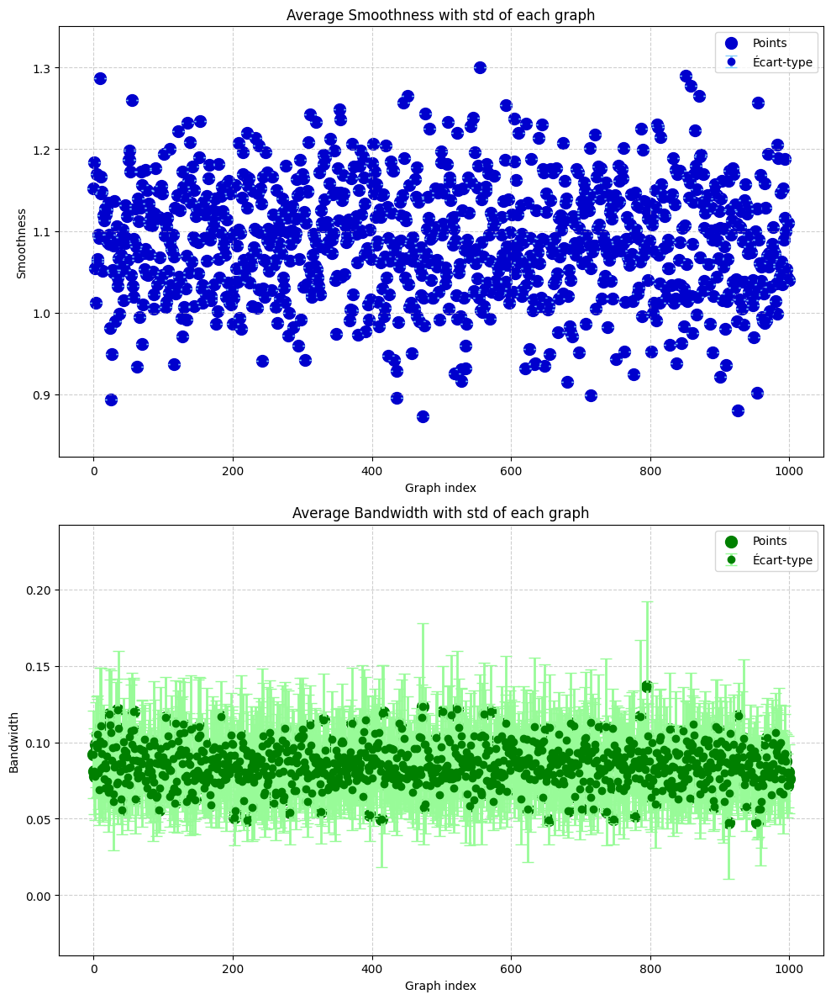

4


100%|██████████| 1000/1000 [01:31<00:00, 10.92it/s]


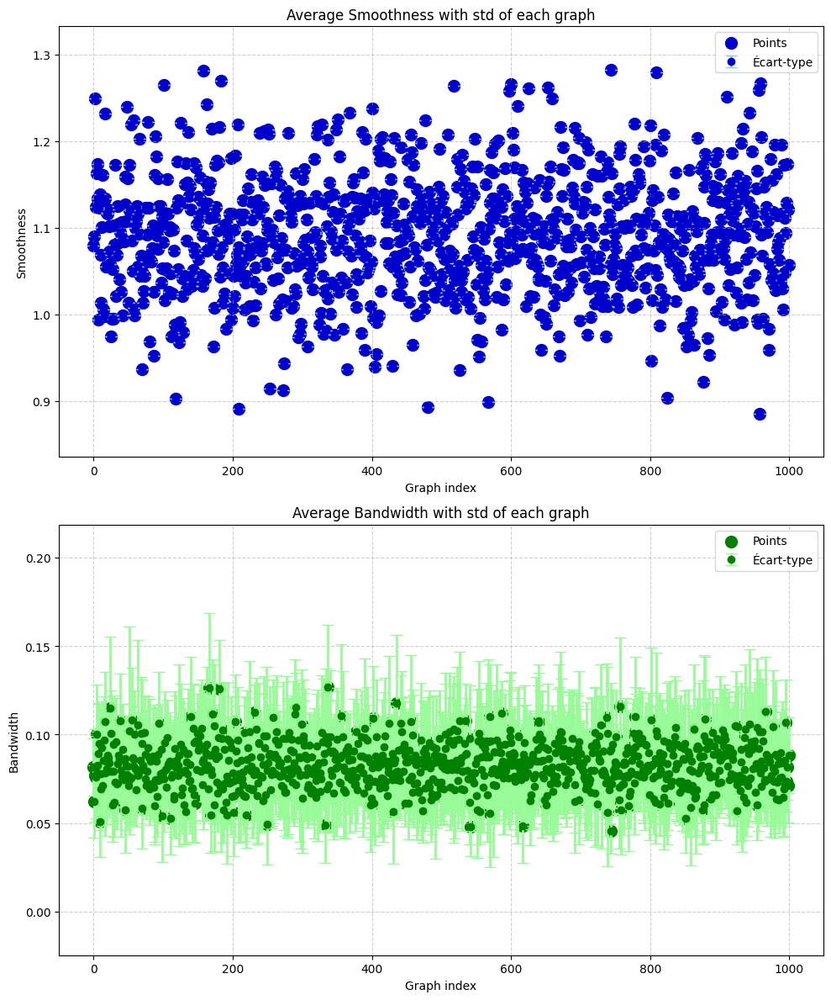

5


100%|██████████| 1000/1000 [01:05<00:00, 15.26it/s]


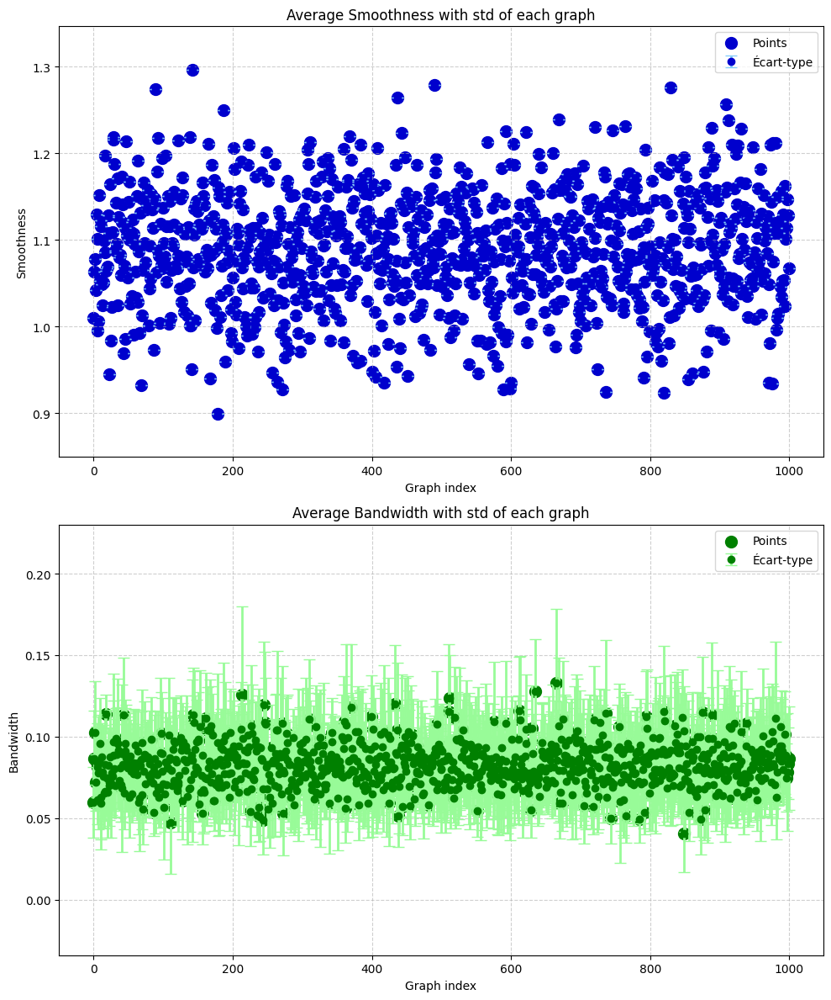

6


100%|██████████| 1000/1000 [01:13<00:00, 13.69it/s]


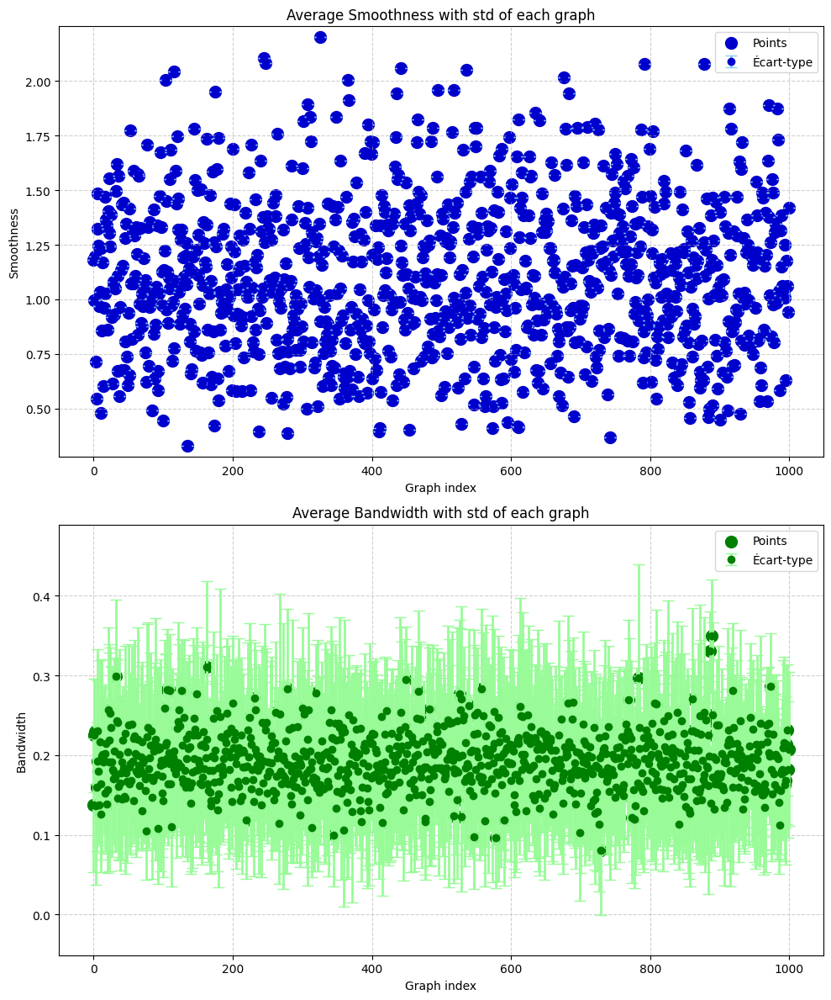

7


100%|██████████| 7/7 [00:05<00:00,  1.22it/s]


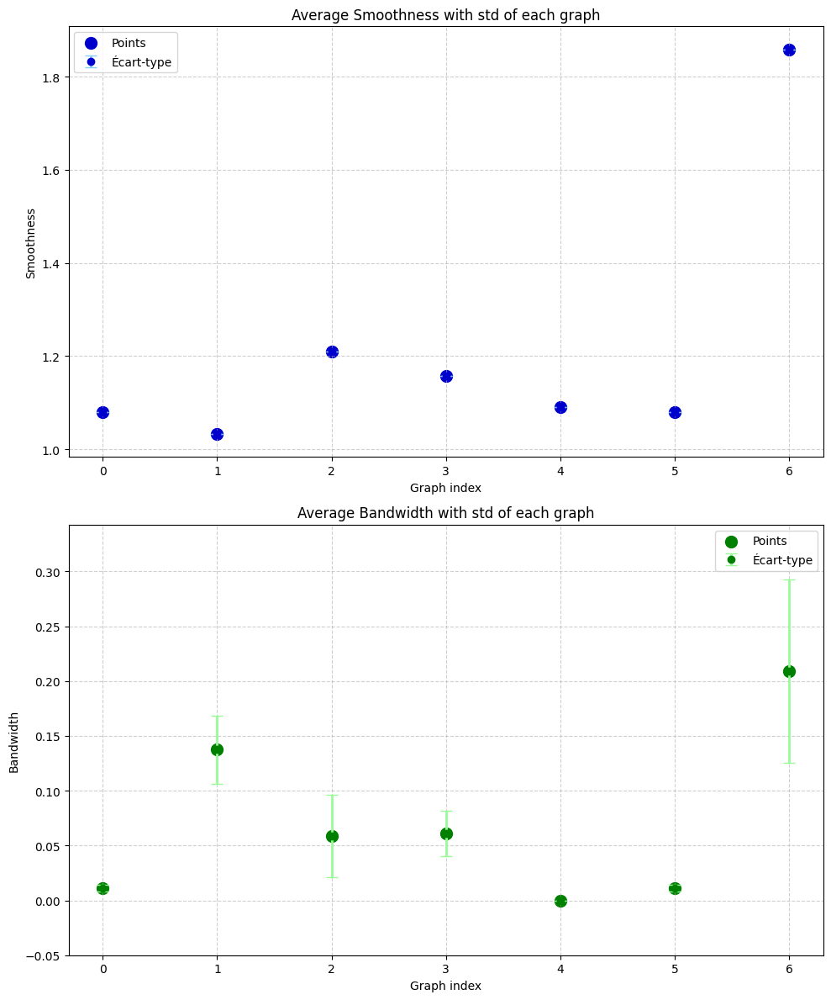

1


In [94]:
%load_ext autoreload
%autoreload 2
from graph_scalar_analyzer import GraphScalarAnalyzer
from tqdm import tqdm
dictfeaturesGraphs = calcul_dictfeatures(LdictGraphs, nodes_features = data.nodes_dataframe, name_column = "load", row = 0,Nsize= 100,  plot_curv = False, test = False, signals_test=None, Fast = True)
dictfeaturesGraphs_vrai = calcul_dictfeatures(LdictGraphs_vrai, nodes_features = data.nodes_dataframe, name_column = "load", row = 0, Nsize= 1000,  plot_curv = False, test = False, signals_test=None, Fast = True)

(7,)
(7, 30)
(7, 30)


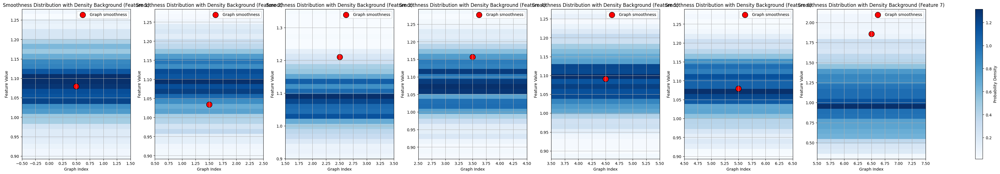

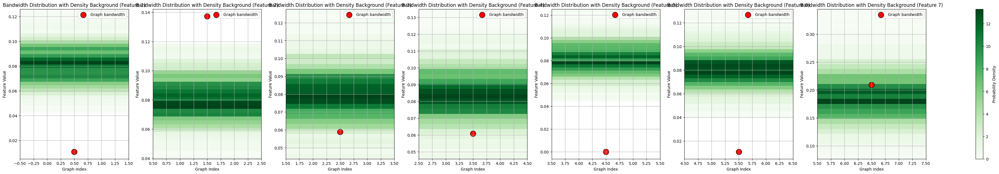

In [96]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

def distribution_calcul(L, nbrange):
    """
    Calculate the probability distribution of a list.

    Args:
    - L (list or np.array): List of values.
    - nbrange (int): Number of bins for the histogram.

    Returns:
    - Lhist (np.array): Normalized histogram of the distribution.
    - bins (np.array): Bin edges.
    """
    bins = np.linspace(min(L), max(L), nbrange + 1)
    hist, _ = np.histogram(L, bins=bins, density=True)
    return hist, bins[:-1]

def plot_distribution(Lhist, bins, title, xlabel, ylabel, color):
    """
    Plot a probability distribution as a histogram.

    Args:
    - Lhist (list or np.array): Values of the distribution.
    - bins (list or np.array): Bin edges corresponding to the distribution.
    - title (str): Title of the plot.
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - color (str): Color of the histogram.
    """
    plt.figure(figsize=(10, 6))
    plt.bar(bins, Lhist, width=(bins[1] - bins[0]), color=color, alpha=0.7)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()

def plot_features_on_distribution(feature_values, density_values, density_x, title="Feature Distribution with Graph Points", xlabel="Feature Value", ylabel="Probability Density"):
    """
    Plots a probability density function with points representing graph feature values, showing the index of each graph.

    Args:
        feature_values (list or np.array): Values of features for the graphs to be plotted as points.
        density_values (list or np.array): Values of the probability density function.
        density_x (list or np.array): X-axis values corresponding to the density values.
        title (str): Title of the plot.
        xlabel (str): Label for the x-axis.
        ylabel (str): Label for the y-axis.
    """
    plt.figure(figsize=(10, 6))

    # Plot the density curve
    plt.plot(density_x, density_values, label="Probability Density", color='blue')

    # Plot the feature points with their graph index
    for idx, value in enumerate(feature_values):
        plt.scatter(value, np.interp(value, density_x, density_values),
                    color='red', s=100, edgecolor='black', label=f"Graph {idx+1}" if idx == 0 else "", zorder=3)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_density_background_with_multiple_features(feature_values_list, density_values_list, Ldensity_x, color='Blues', title="Feature Distribution with Density Background", label='graph smoothness'):
    """
    Plots a probability density background for each feature value with a subplot for each feature.

    Args:
        feature_values_list (list or np.array): List of feature values for the graphs.
        density_values_list (list or np.array): List of the probability density function values for each feature.
        Ldensity_x (list or np.array): List of X-axis values corresponding to the density values for each feature.
        color (str): Colormap for the density background.
        title (str): Title of the plot.
        label (str): Label for the points plotted.
    """
    num_features = len(feature_values_list)
    fig, axes = plt.subplots(1, num_features, figsize=(5 * num_features, 6), constrained_layout=True)

    for i, (feature_values, density_values, density_x) in enumerate(zip(feature_values_list, density_values_list, Ldensity_x)):
        ax = axes[i] if num_features > 1 else axes

        # Normalize the density values using Matplotlib's Normalize
        norm = Normalize(vmin=np.min(density_values), vmax=np.max(density_values))

        # Create a meshgrid for plotting
        X, Y = np.meshgrid(np.array([i, i+1]), density_x)
        C = np.tile(density_values, (2,1)).T
        # print('desnsity_values',density_values)
        # print('X',X)
        # print('Y',Y)
        # print('C',C)
        # Plot the colormap using the normalized density values
        c = ax.pcolormesh(X, Y, C, cmap=color, shading='auto', norm=norm)

        # Add the feature point on top of the density background
        ax.scatter(i + 0.5, feature_values, color='red', edgecolor='black', s=200, label=label)

        # Titles, labels, and legends for each subplot
        ax.set_title(f"{title} (Feature {i + 1})")
        ax.set_xlabel("Graph Index")
        ax.set_ylabel("Feature Value")
        ax.grid(True)
        ax.legend()

    # Add a colorbar common to all subplots
    fig.colorbar(c, ax=axes, orientation='vertical', label="Probability Density")
    plt.show()

def real_graph_on_density(dictfeaturesGraphs, dictfeaturesGraphs_vrai, nbrange = 10 ):
    Lmean_smoothness = []
    Lmean_bandwidth = []
    Llhist_smoothness = []
    Llhist_bandwidth = []
    Lbins_smoothness = []
    Lbins_bandwidth = []
    # We are taking back the list of the features of the graphs
    for i in range(len(dictfeaturesGraphs)):
        Lmean_smoothness.append(dictfeaturesGraphs["Graphs"+str(i)][0])
        Lmean_bandwidth.append(dictfeaturesGraphs["Graphs"+str(i)][1])
        Lhist_smoothness, bins_smoothness = distribution_calcul(Lmean_smoothness[i], nbrange)
        Lhist_bandwidth, bins_bandwidth = distribution_calcul(Lmean_bandwidth[i], nbrange)
        Llhist_smoothness.append(Lhist_smoothness)
        Llhist_bandwidth.append(Lhist_bandwidth)
        Lbins_smoothness.append(bins_smoothness)
        Lbins_bandwidth.append(bins_bandwidth)
    Lmean_smoothness = np.array(Lmean_smoothness)
    Lmean_bandwidth = np.array(Lmean_bandwidth)
    Llhist_smoothness = np.array(Llhist_smoothness)
    Llhist_bandwidth = np.array(Llhist_bandwidth)
    Lbins_smoothness = np.array(Lbins_smoothness)
    Lbins_bandwidth = np.array(Lbins_bandwidth)


    
    
    # We are taking back the list of the features of the real graph
    for i in range(len(dictfeaturesGraphs_vrai)):
        Lmean_smoothness_real_graph = dictfeaturesGraphs_vrai["Graphs"+str(i)][0]
        Lmean_bandwidth_real_graph= dictfeaturesGraphs_vrai["Graphs"+str(i)][1]
    Lmean_smoothness_real_graph = np.array(Lmean_smoothness_real_graph)
    Lmean_bandwidth_real_graph = np.array(Lmean_bandwidth_real_graph)
    
    #we plot the distribution of the smoothness and bandwidth with the real graph value on it
    print(Lmean_smoothness_real_graph.shape)
    print(Llhist_smoothness.shape)
    print(Lbins_smoothness.shape)
    plot_density_background_with_multiple_features(Lmean_smoothness_real_graph, Llhist_smoothness, Lbins_smoothness, title="Smoothness Distribution with Density Background", color = 'Blues', label = 'Graph smoothness')  
    plot_density_background_with_multiple_features(Lmean_bandwidth_real_graph, Llhist_bandwidth, Lbins_bandwidth, title="Bandwidth Distribution with Density Background", color = 'Greens', label = 'Graph bandwidth')

real_graph_on_density(dictfeaturesGraphs, dictfeaturesGraphs_vrai, nbrange = 30 )


### Brouillon 

In [38]:
%load_ext autoreload
%autoreload 2
from graph_builder import GraphBuilder
#Genration of random graphs
LdictGraphs = []
for n in range(len(L_path_to_W)) :
    dictGraphs = {}
    for i in range(100) :
        Graph = GraphBuilder(L_path_to_W[n], test=True, **df_pos)
        W = Graph.W
        dictGraphs["Graphs"+str(i)] = Graph
    LdictGraphs.append(dictGraphs)


    
LdictGraphs_vrai = []
dictGraphs = {}
for n in range(len(L_path_to_W)) :
    Graph = GraphBuilder(L_path_to_W[n], test=False, **df_pos)
    W = Graph.W 
    dictGraphs["Graphs" + str(n)] = Graph
    
LdictGraphs_vrai.append(dictGraphs)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


100%|██████████| 100/100 [00:05<00:00, 18.76it/s]


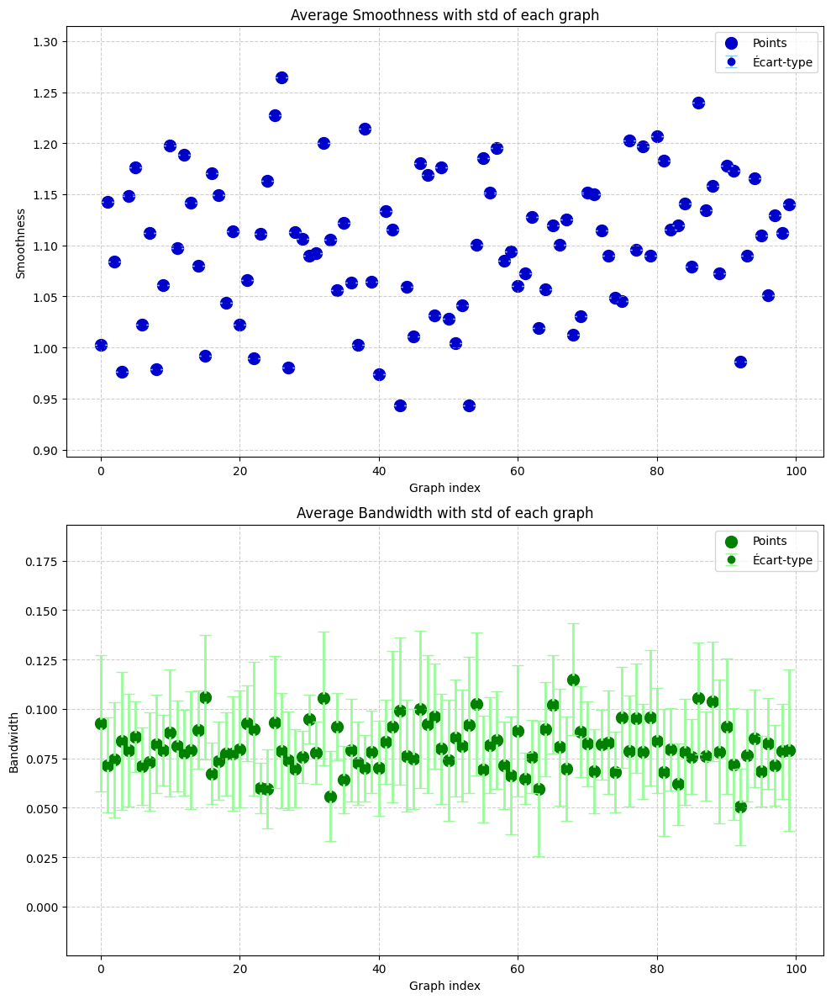

1


100%|██████████| 100/100 [00:05<00:00, 17.73it/s]


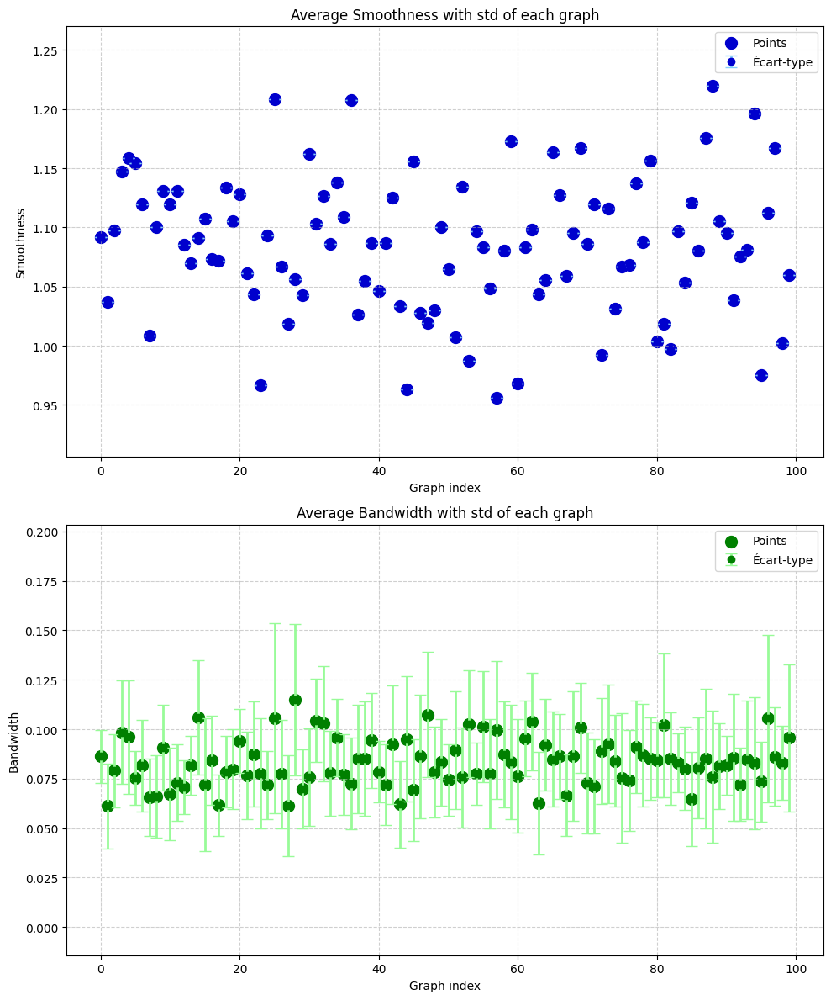

2


100%|██████████| 100/100 [00:05<00:00, 17.98it/s]


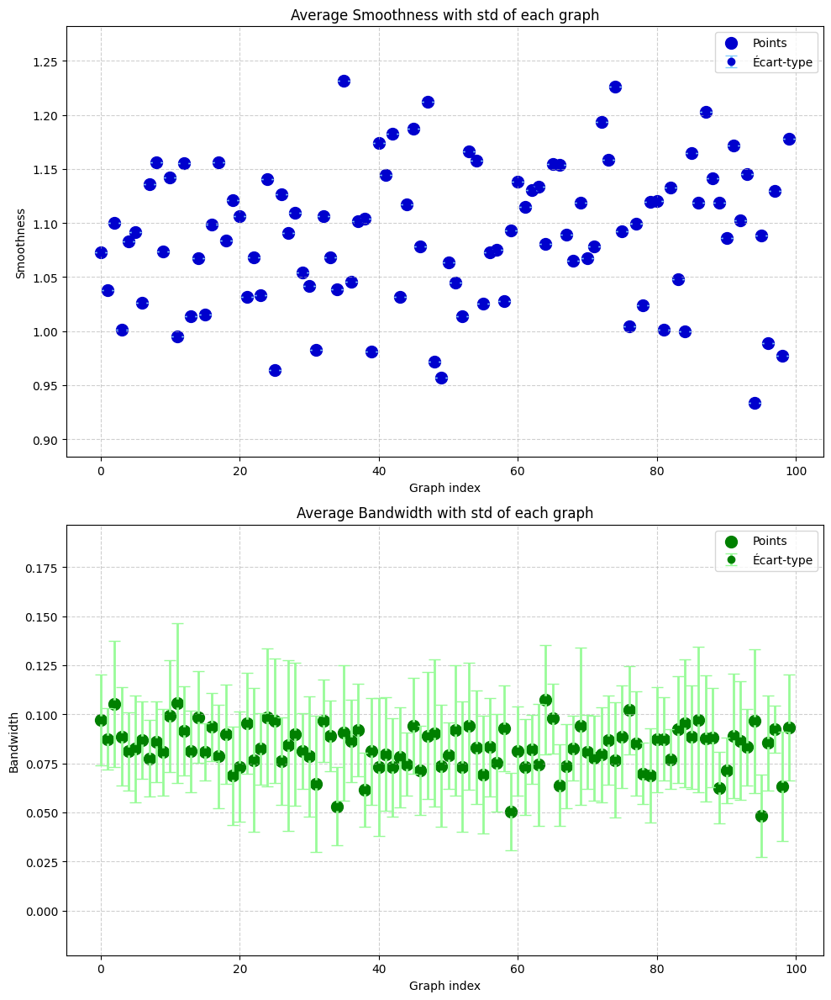

3


100%|██████████| 100/100 [00:05<00:00, 18.86it/s]


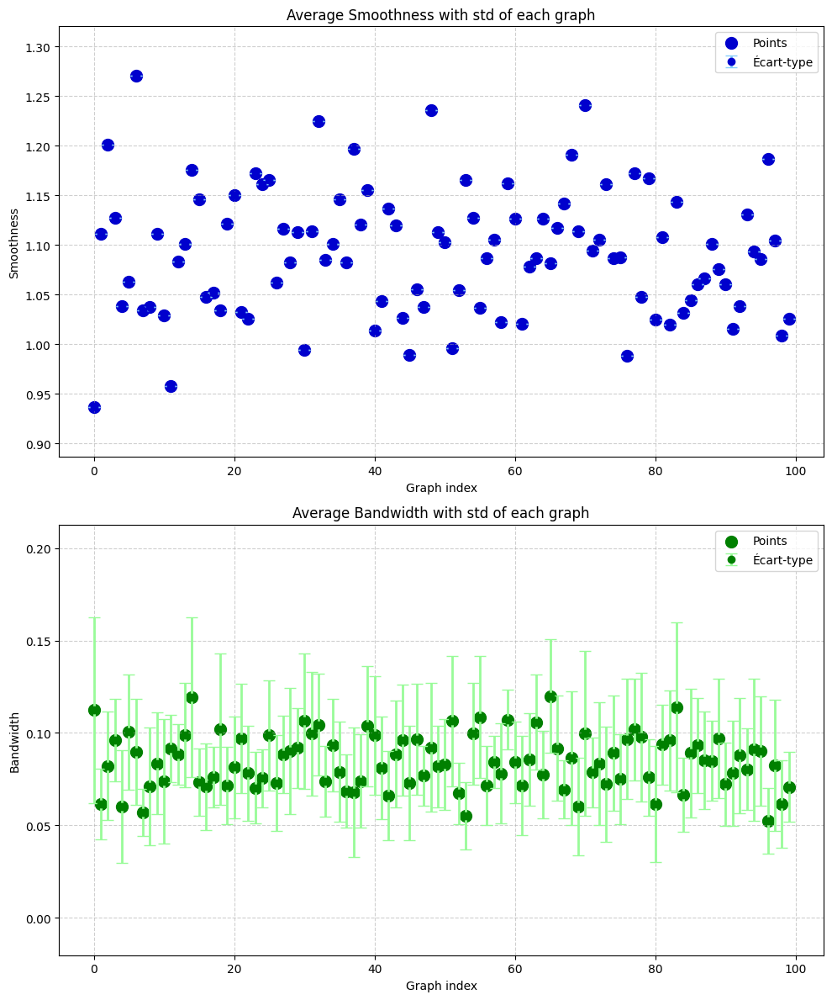

4


100%|██████████| 100/100 [00:05<00:00, 18.42it/s]


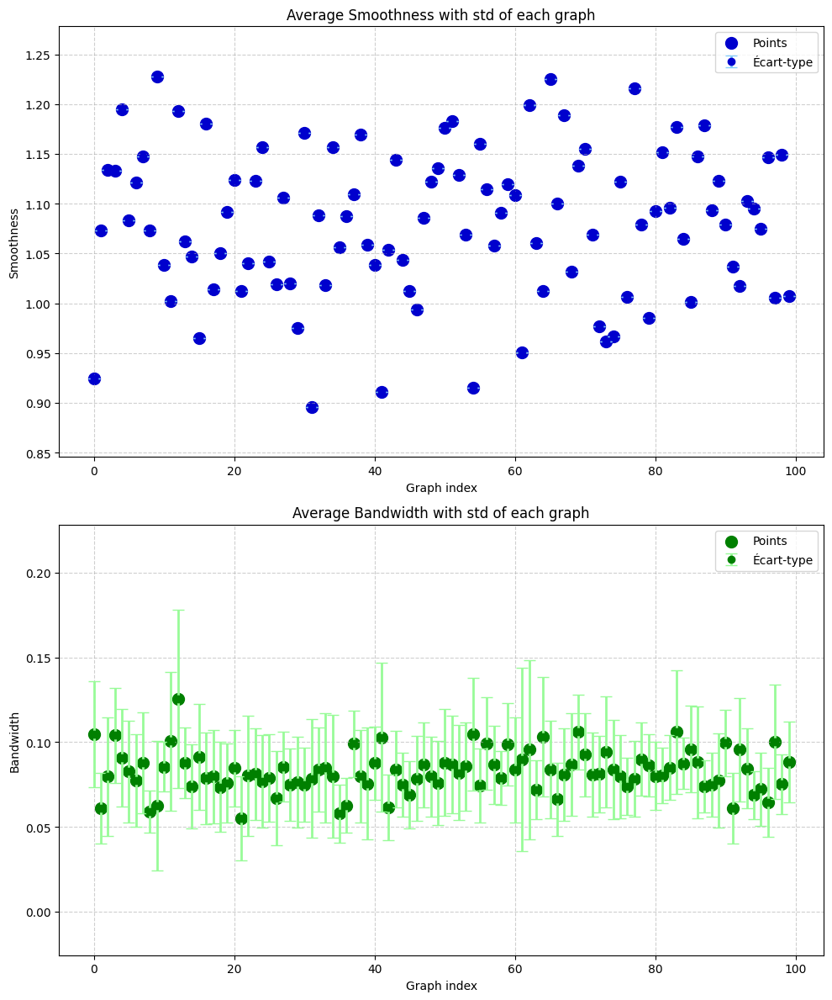

5


100%|██████████| 100/100 [00:05<00:00, 18.01it/s]


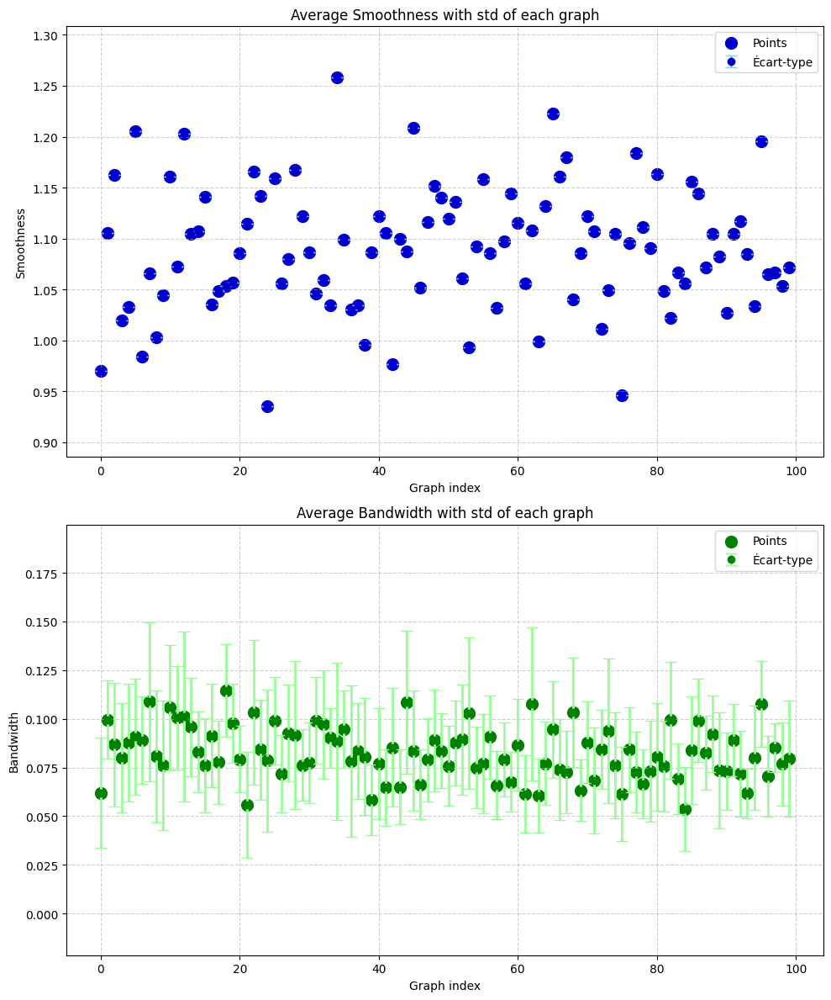

6


100%|██████████| 100/100 [00:05<00:00, 18.02it/s]


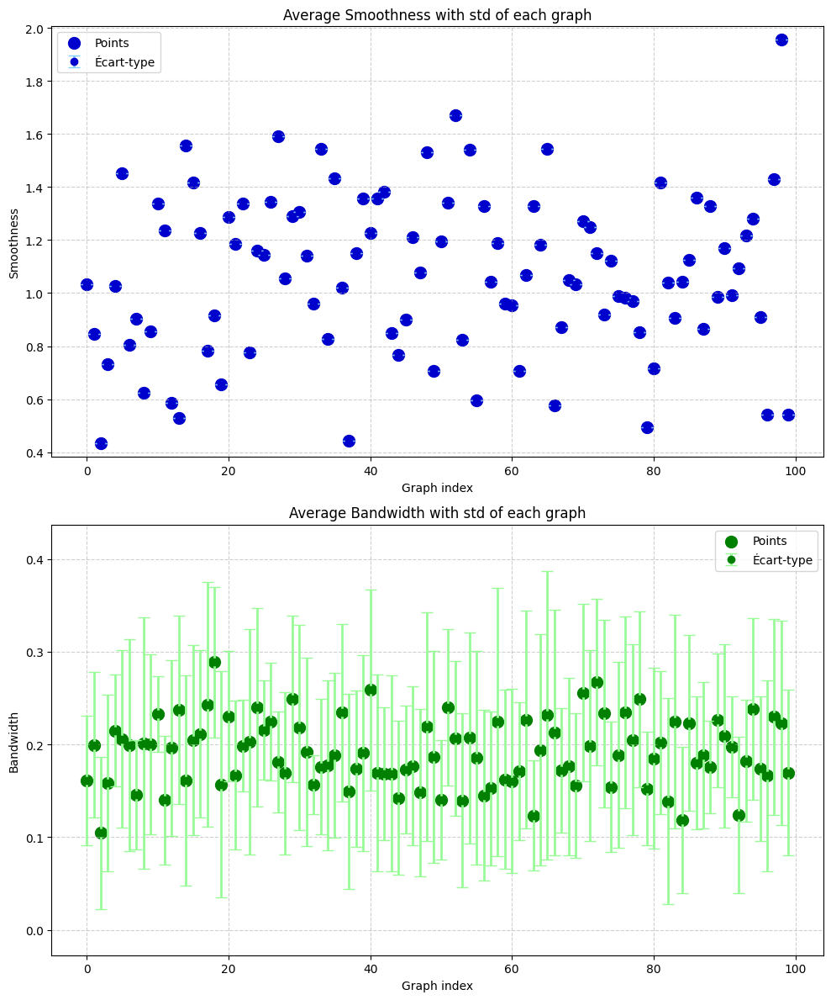

7


100%|██████████| 7/7 [00:02<00:00,  3.35it/s]


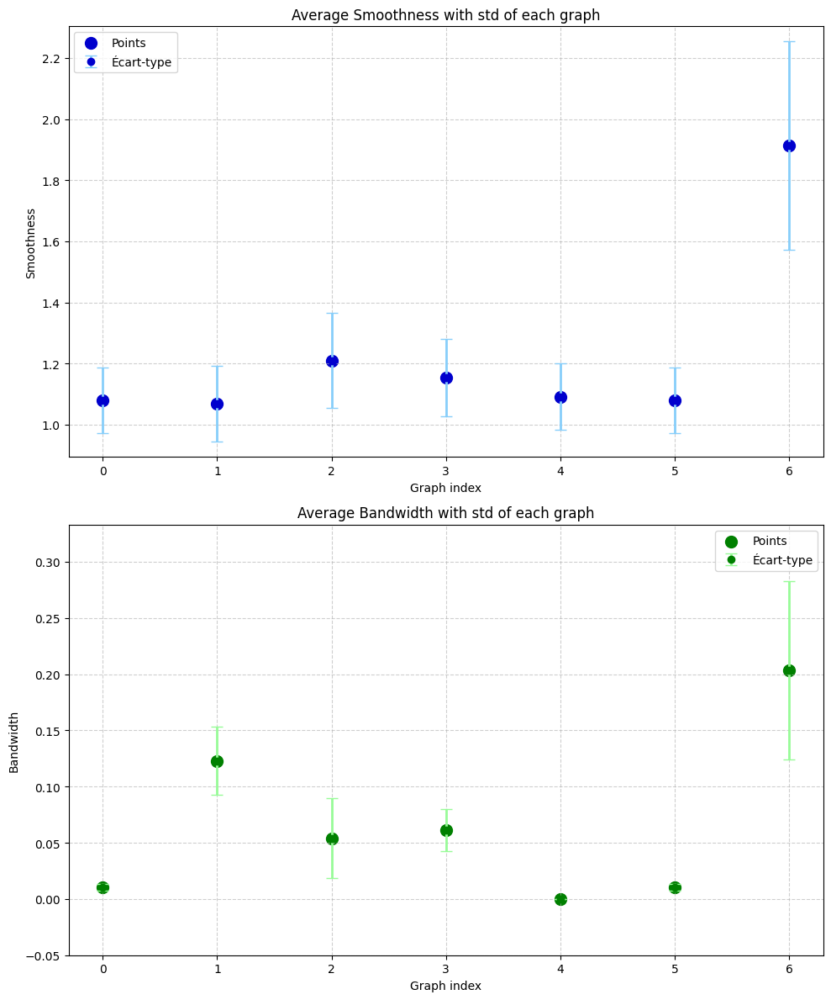

1


In [40]:
%load_ext autoreload
%autoreload 2
from graph_scalar_analyzer import GraphScalarAnalyzer
from tqdm import tqdm
dictfeaturesGraphs = calcul_dictfeatures(LdictGraphs, nodes_features = data.nodes_dataframe, name_column = "load", row = 0,Nsize= 100,  plot_curv = False, test = False, signals_test=None, Fast = True)
dictfeaturesGraphs_vrai = calcul_dictfeatures(LdictGraphs_vrai, nodes_features = data.nodes_dataframe, name_column = "load", row = 0, Nsize= 100,  plot_curv = False, test = False, signals_test=None, Fast = False)

In [137]:
print(dictfeaturesGraphs)
print(dictfeaturesGraphs_vrai)

{'Graphs0': [array([1.15977615, 1.08125772]), array([0.07526258, 0.06148543]), array([0.13006433, 0.11720199]), array([0.01948405, 0.02657677])], 'Graphs1': [array([1.13556752, 1.13070286]), array([0.08299305, 0.1165019 ]), array([0.11443929, 0.11982751]), array([0.02205424, 0.03460625])], 'Graphs2': [array([1.10037636, 1.08900052]), array([0.09230581, 0.08546815]), array([0.12617224, 0.11031221]), array([0.02240574, 0.01612802])], 'Graphs3': [array([1.15895885, 0.9455972 ]), array([0.08686316, 0.07155132]), array([0.12692137, 0.08406448]), array([0.02532427, 0.04146132])], 'Graphs4': [array([0.96554848, 0.97115574]), array([0.08595689, 0.08517458]), array([0.08137645, 0.09590181]), array([0.02566915, 0.02617501])], 'Graphs5': [array([1.11559567, 1.15730423]), array([0.06809338, 0.07938313]), array([0.11874478, 0.12102236]), array([0.02112611, 0.02640515])], 'Graphs6': [array([1.12442961, 1.27875708]), array([0.15962553, 0.27304832]), array([0.19397206, 0.18882375]), array([0.07882344,

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

def distribution_calcul(L, nbrange):
    """
    Calculate the probability distribution of a list.

    Args:
    - L (list or np.array): List of values.
    - nbrange (int): Number of bins for the histogram.

    Returns:
    - Lhist (np.array): Normalized histogram of the distribution.
    - bins (np.array): Bin edges.
    """
    bins = np.linspace(min(L), max(L), nbrange + 1)
    hist, _ = np.histogram(L, bins=bins, density=True)
    return hist, bins[:-1]

def plot_distribution(Lhist, bins, title, xlabel, ylabel, color):
    """
    Plot a probability distribution as a histogram.

    Args:
    - Lhist (list or np.array): Values of the distribution.
    - bins (list or np.array): Bin edges corresponding to the distribution.
    - title (str): Title of the plot.
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - color (str): Color of the histogram.
    """
    plt.figure(figsize=(10, 6))
    plt.bar(bins, Lhist, width=(bins[1] - bins[0]), color=color, alpha=0.7)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()

def plot_features_on_distribution(feature_values, density_values, density_x, title="Feature Distribution with Graph Points", xlabel="Feature Value", ylabel="Probability Density"):
    """
    Plots a probability density function with points representing graph feature values, showing the index of each graph.

    Args:
        feature_values (list or np.array): Values of features for the graphs to be plotted as points.
        density_values (list or np.array): Values of the probability density function.
        density_x (list or np.array): X-axis values corresponding to the density values.
        title (str): Title of the plot.
        xlabel (str): Label for the x-axis.
        ylabel (str): Label for the y-axis.
    """
    plt.figure(figsize=(10, 6))

    # Plot the density curve
    plt.plot(density_x, density_values, label="Probability Density", color='blue')

    # Plot the feature points with their graph index
    for idx, value in enumerate(feature_values):
        plt.scatter(value, np.interp(value, density_x, density_values),
                    color='red', s=100, edgecolor='black', label=f"Graph {idx+1}" if idx == 0 else "", zorder=3)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_density_background_with_multiple_features(feature_values_list, density_values_list, Ldensity_x, color='Blues', title="Feature Distribution with Density Background", label='graph smoothness'):
    """
    Plots a probability density background for each feature value with a subplot for each feature.

    Args:
        feature_values_list (list or np.array): List of feature values for the graphs.
        density_values_list (list or np.array): List of the probability density function values for each feature.
        Ldensity_x (list or np.array): List of X-axis values corresponding to the density values for each feature.
        color (str): Colormap for the density background.
        title (str): Title of the plot.
        label (str): Label for the points plotted.
    """
    num_features = len(feature_values_list)
    fig, axes = plt.subplots(1, num_features, figsize=(5 * num_features, 6), constrained_layout=True)

    for i, (feature_values, density_values, density_x) in enumerate(zip(feature_values_list, density_values_list, Ldensity_x)):
        ax = axes[i] if num_features > 1 else axes

        # Normalize the density values using Matplotlib's Normalize
        norm = Normalize(vmin=np.min(density_values), vmax=np.max(density_values))

        # Create a meshgrid for plotting
        X, Y = np.meshgrid(np.array([i, i+1]), density_x)
        C = np.tile(density_values, (2,1)).T
        # print('desnsity_values',density_values)
        # print('X',X)
        # print('Y',Y)
        # print('C',C)
        # Plot the colormap using the normalized density values
        c = ax.pcolormesh(X, Y, C, cmap=color, shading='auto', norm=norm)

        # Add the feature point on top of the density background
        ax.scatter(i + 0.5, feature_values, color='red', edgecolor='black', s=200, label=label)

        # Titles, labels, and legends for each subplot
        ax.set_title(f"{title} (Feature {i + 1})")
        ax.set_xlabel("Graph Index")
        ax.set_ylabel("Feature Value")
        ax.grid(True)
        ax.legend()

    # Add a colorbar common to all subplots
    fig.colorbar(c, ax=axes, orientation='vertical', label="Probability Density")
    plt.show()

def real_graph_on_density(dictfeaturesGraphs, dictfeaturesGraphs_vrai, nbrange = 10 ):
    Lmean_smoothness = []
    Lmean_bandwidth = []
    Llhist_smoothness = []
    Llhist_bandwidth = []
    Lbins_smoothness = []
    Lbins_bandwidth = []
    # We are taking back the list of the features of the graphs
    for i in range(len(dictfeaturesGraphs)):
        Lmean_smoothness.append(dictfeaturesGraphs["Graphs"+str(i)][0])
        Lmean_bandwidth.append(dictfeaturesGraphs["Graphs"+str(i)][1])
        Lhist_smoothness, bins_smoothness = distribution_calcul(Lmean_smoothness[i], nbrange)
        Lhist_bandwidth, bins_bandwidth = distribution_calcul(Lmean_bandwidth[i], nbrange)
        Llhist_smoothness.append(Lhist_smoothness)
        Llhist_bandwidth.append(Lhist_bandwidth)
        Lbins_smoothness.append(bins_smoothness)
        Lbins_bandwidth.append(bins_bandwidth)
    Lmean_smoothness = np.array(Lmean_smoothness)
    Lmean_bandwidth = np.array(Lmean_bandwidth)
    Llhist_smoothness = np.array(Llhist_smoothness)
    Llhist_bandwidth = np.array(Llhist_bandwidth)
    Lbins_smoothness = np.array(Lbins_smoothness)
    Lbins_bandwidth = np.array(Lbins_bandwidth)


    
    
    # We are taking back the list of the features of the real graph
    for i in range(len(dictfeaturesGraphs_vrai)):
        Lmean_smoothness_real_graph = dictfeaturesGraphs_vrai["Graphs"+str(i)][0]
        Lmean_bandwidth_real_graph= dictfeaturesGraphs_vrai["Graphs"+str(i)][1]
    Lmean_smoothness_real_graph = np.array(Lmean_smoothness_real_graph)
    Lmean_bandwidth_real_graph = np.array(Lmean_bandwidth_real_graph)
    
    #we plot the distribution of the smoothness and bandwidth with the real graph value on it
    print(Lmean_smoothness_real_graph.shape)
    print(Llhist_smoothness.shape)
    print(Lbins_smoothness.shape)
    plot_density_background_with_multiple_features(Lmean_smoothness_real_graph, Llhist_smoothness, Lbins_smoothness, title="Smoothness Distribution with Density Background", color = 'Blues', label = 'Graph smoothness')  
    plot_density_background_with_multiple_features(Lmean_bandwidth_real_graph, Llhist_bandwidth, Lbins_bandwidth, title="Bandwidth Distribution with Density Background", color = 'Greens', label = 'Graph bandwidth')

real_graph_on_density(dictfeaturesGraphs, dictfeaturesGraphs_vrai, nbrange = 25 )


NameError: name 'dictfeaturesGraphs' is not defined

0.9113139607710193
1.2353814260943983
0.04553230024748367
0.12150144352221048
0.0700887181928425
0.14531622545368048
0.014242473761376403
0.045429387549827664


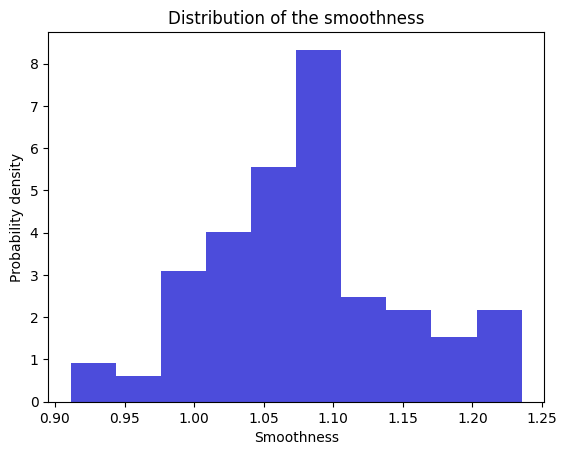

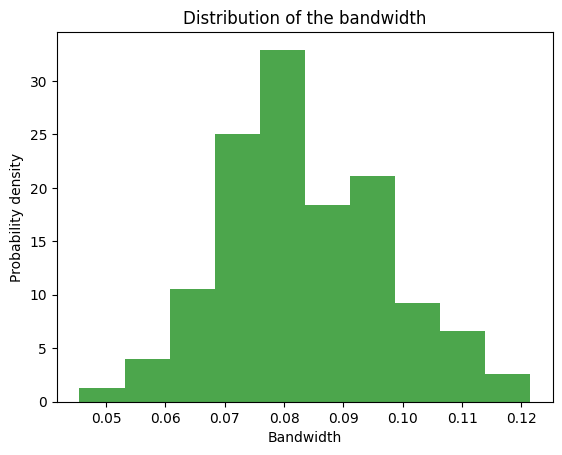

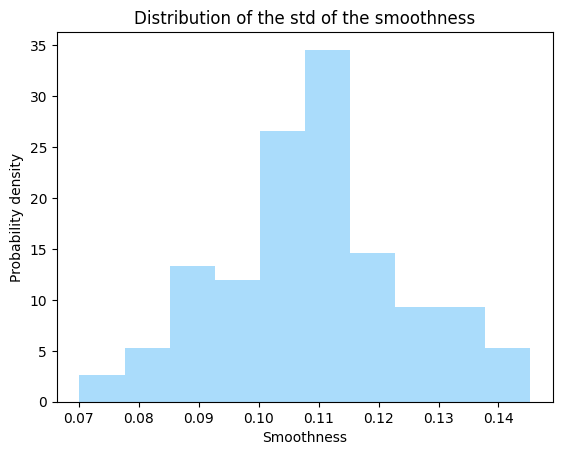

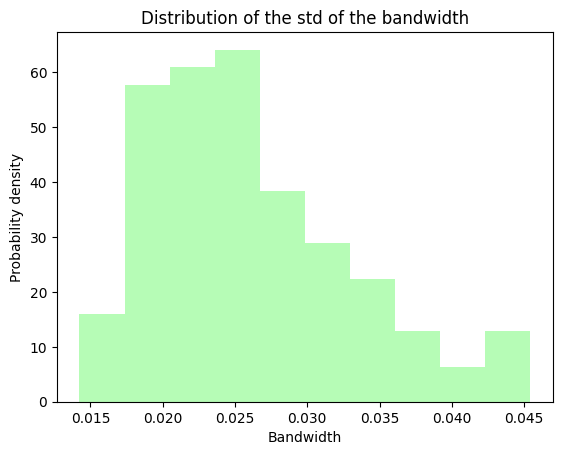

In [47]:
nbrange = 10
def distribution_calcul (L, nbrange):
    """ ___summary__
    In this function we are calcultating the distribution of a list
    __args__: 
    - L : list of values
    - nbrange : number of range for the histogram
    __return__:
    - Lhist : list of the distribution"""
    Lhist = []
    print(min(L))
    print(max(L))
    for i in range(nbrange) :
        Boundinf =min(L)+ i /(nbrange-1) * (max(L)-min(L))
        Boundsup = min(L)+ (i+1) /(nbrange-1) * (max(L)-min(L))
        Lhist.append(len([x for x in L if x>=Boundinf and x<Boundsup]))
    Lhist = np.array(Lhist)/len(L)
    return Lhist

def plot_distribution(Lhist, L, title, xlabel, ylabel, color):
    """
    Plot a probability distribution as a histogram.

    Args:
    - Lhist (list): List of the distribution values.
    - L (list): List of the data values for reference.
    - title (str): Title of the plot.
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - color (str): Color of the histogram.
    """
    plt.hist(L, bins=len(Lhist), density=True, color=color, alpha=0.7)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

Lhist_smoothness = distribution_calcul(Lmean_smoothness, nbrange)
Lhist_bandwidth = distribution_calcul(Lmean_bandwidth, nbrange)
Lhist_smoothness_std = distribution_calcul(Lstd_smoothness, nbrange)
Lhist_bandwidth_std = distribution_calcul(Lstd_bandwidth, nbrange)
plot_distribution(Lhist_smoothness,Lmean_smoothness, "Distribution of the smoothness", "Smoothness", "Probability density", color='mediumblue')
plot_distribution(Lhist_bandwidth,Lmean_bandwidth, "Distribution of the bandwidth", "Bandwidth", "Probability density", color='green')
plot_distribution(Lhist_smoothness_std,Lstd_smoothness, "Distribution of the std of the smoothness", "Smoothness", "Probability density", color='lightskyblue')
plot_distribution(Lhist_bandwidth_std,Lstd_bandwidth, "Distribution of the std of the bandwidth", "Bandwidth", "Probability density", color='palegreen')


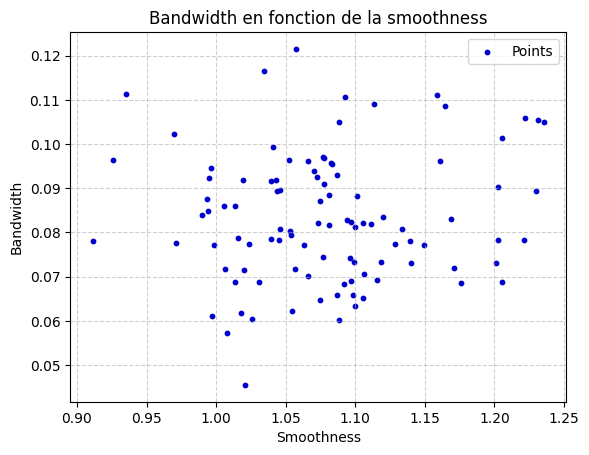

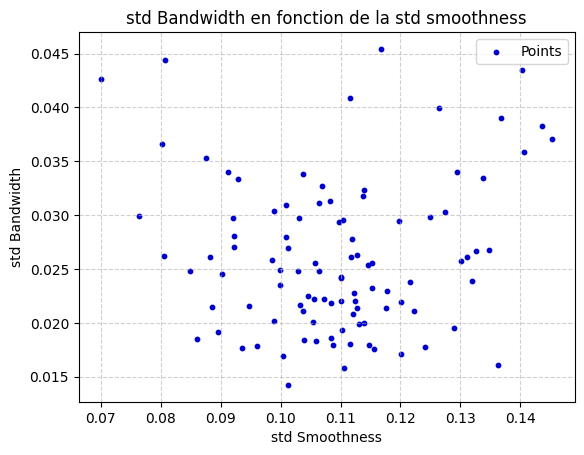

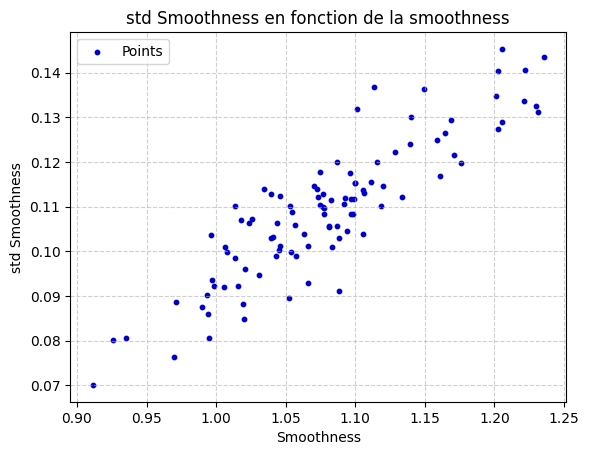

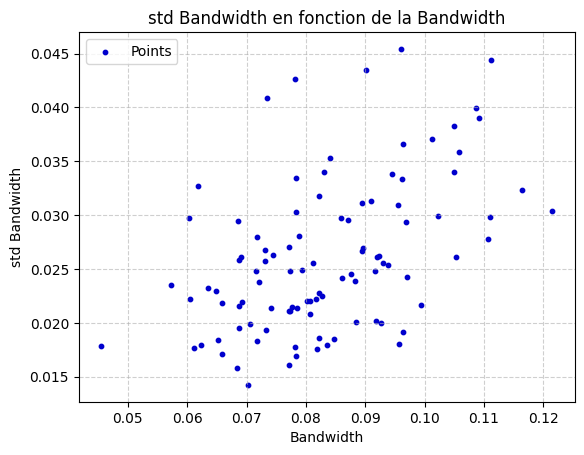

In [46]:
# affichage de la bande passante en fonction de la smoothness
def plot_correlation(Lx, Ly,xlabel, ylabel, title) : 
    plt.scatter(Lx, Ly, color='mediumblue', label='Points', s=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.show()

plot_correlation(Lmean_smoothness, Lmean_bandwidth, "Smoothness", "Bandwidth", "Bandwidth en fonction de la smoothness")
plot_correlation(Lstd_smoothness, Lstd_bandwidth, "std Smoothness", "std Bandwidth", "std Bandwidth en fonction de la std smoothness")
plot_correlation(Lmean_smoothness, Lstd_smoothness, "Smoothness", "std Smoothness", "std Smoothness en fonction de la smoothness")
plot_correlation(Lmean_bandwidth, Lstd_bandwidth, "Bandwidth", "std Bandwidth", "std Bandwidth en fonction de la Bandwidth")
    
    



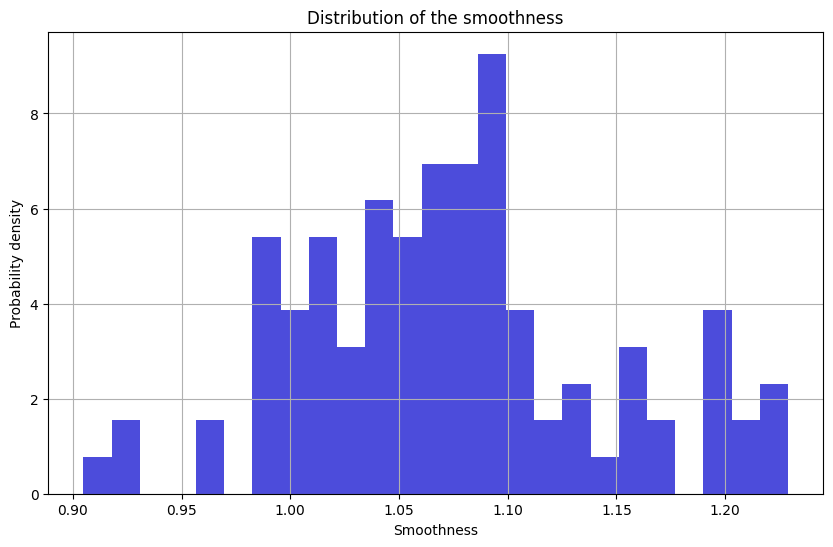

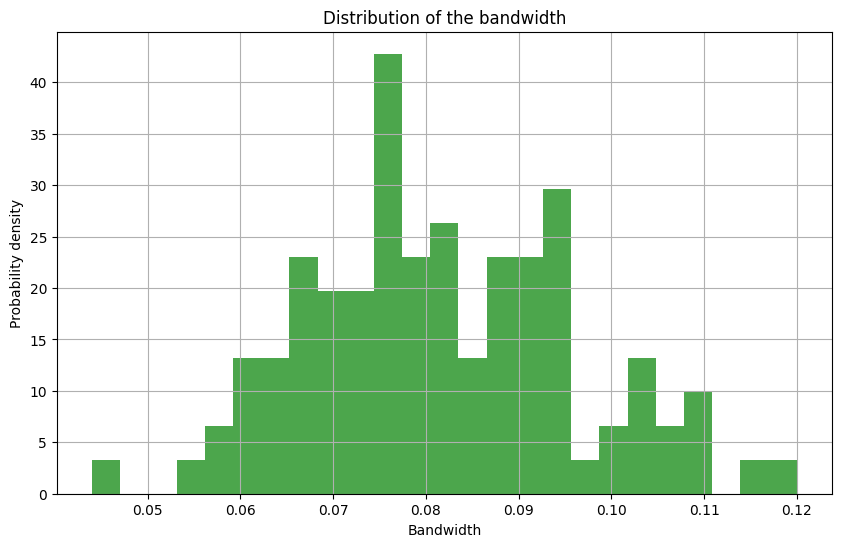

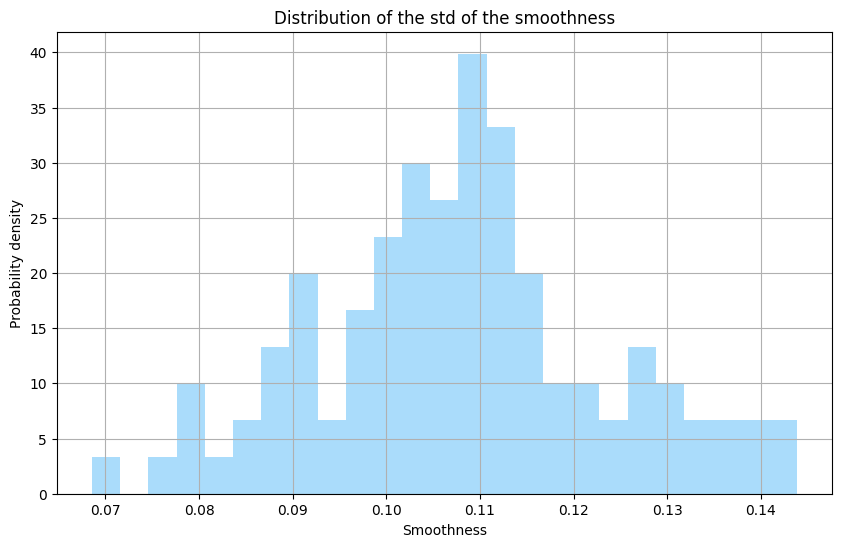

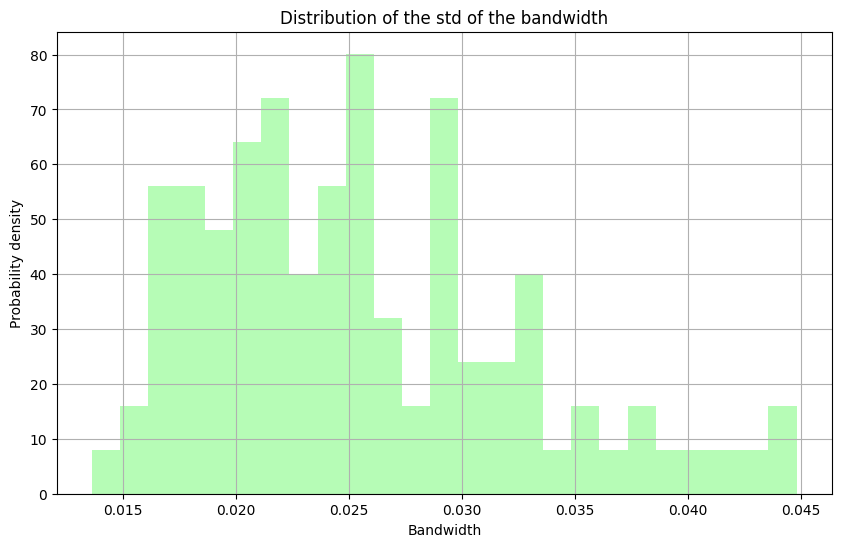

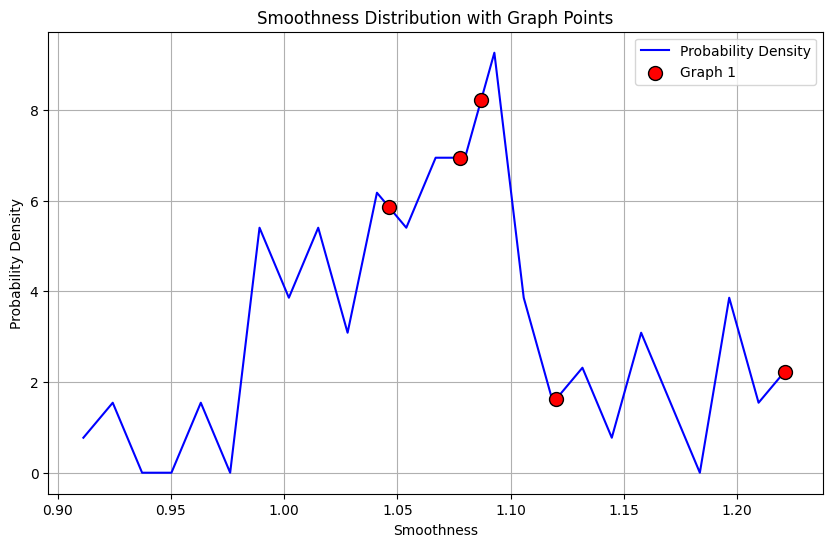

ValueError: x and y must be the same size

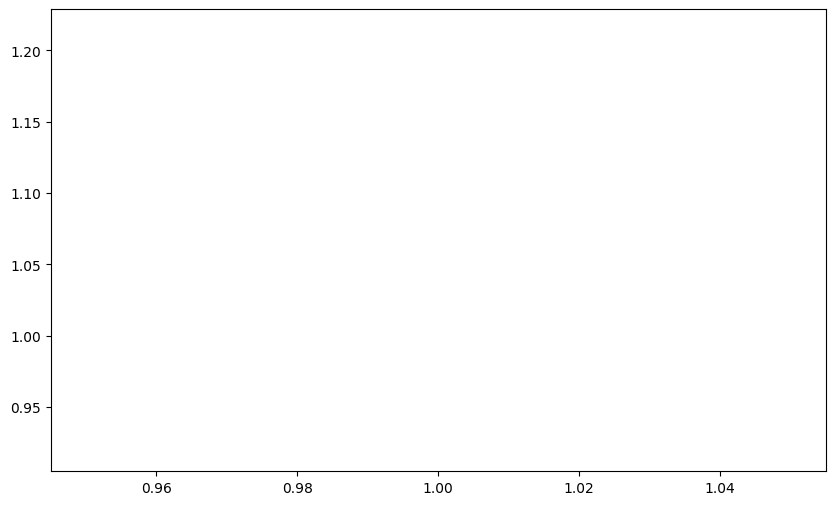

In [151]:
import matplotlib.pyplot as plt
import numpy as np

def distribution_calcul(L, nbrange):
    """
    Calculate the probability distribution of a list.

    Args:
    - L (list or np.array): List of values.
    - nbrange (int): Number of bins for the histogram.

    Returns:
    - Lhist (np.array): Normalized histogram of the distribution.
    - bins (np.array): Bin edges.
    """
    bins = np.linspace(min(L), max(L), nbrange + 1)
    hist, _ = np.histogram(L, bins=bins, density=True)
    return hist, bins[:-1]

def plot_distribution(Lhist, bins, title, xlabel, ylabel, color):
    """
    Plot a probability distribution as a histogram.

    Args:
    - Lhist (list or np.array): Values of the distribution.
    - bins (list or np.array): Bin edges corresponding to the distribution.
    - title (str): Title of the plot.
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - color (str): Color of the histogram.
    """
    plt.figure(figsize=(10, 6))
    plt.bar(bins, Lhist, width=(bins[1] - bins[0]), color=color, alpha=0.7)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()

def plot_features_on_distribution(feature_values, density_values, density_x, title="Feature Distribution with Graph Points", xlabel="Feature Value", ylabel="Probability Density"):
    """
    Plots a probability density function with points representing graph feature values, showing the index of each graph.

    Args:
        feature_values (list or np.array): Values of features for the graphs to be plotted as points.
        density_values (list or np.array): Values of the probability density function.
        density_x (list or np.array): X-axis values corresponding to the density values.
        title (str): Title of the plot.
        xlabel (str): Label for the x-axis.
        ylabel (str): Label for the y-axis.
    """
    plt.figure(figsize=(10, 6))

    # Plot the density curve
    plt.plot(density_x, density_values, label="Probability Density", color='blue')

    # Plot the feature points with their graph index
    for idx, value in enumerate(feature_values):
        plt.scatter(value, np.interp(value, density_x, density_values),
                    color='red', s=100, edgecolor='black', label=f"Graph {idx+1}" if idx == 0 else "", zorder=3)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_density_background_with_features(feature_values, density_values, density_x, title="Feature Distribution with Density Background"):
    """
    Plots a probability density background with points representing graph feature values.
    
    Args:
        feature_values (list or np.array): Values of features for the graphs.
        density_values (list or np.array): Values of the probability density function.
        density_x (list or np.array): X-axis values corresponding to the density values.
        title (str): Title of the plot.
    """
    # Normalize density values for colormap scaling
    norm_density = (density_values - np.min(density_values)) / (np.max(density_values) - np.min(density_values))
    
    plt.figure(figsize=(10, 6))

    # Create a color mesh for the background proportional to the density
    X, Y = np.meshgrid(1, density_x)
    plt.pcolormesh(X, Y, np.tile(norm_density, (1, 1)).T, cmap='Blues', shading='auto')

    # Plot points (graph index on x-axis and feature value on y-axis)
    plt.scatter(0.5, feature_values, color='red', edgecolor='black', s=100, label='Graph Features')
    
    # Title and labels
    plt.title(title)
    plt.xlabel("Graph Index")
    plt.ylabel("Feature Value")
    plt.colorbar(label="Probability Density")
    plt.grid(True)
    plt.legend()
    plt.show()

# Applying the functions
nbrange = 25
Lhist_smoothness, bins_smoothness = distribution_calcul(Lmean_smoothness, nbrange)
Lhist_bandwidth, bins_bandwidth = distribution_calcul(Lmean_bandwidth, nbrange)
Lhist_smoothness_std, bins_smoothness_std = distribution_calcul(Lstd_smoothness, nbrange)
Lhist_bandwidth_std, bins_bandwidth_std = distribution_calcul(Lstd_bandwidth, nbrange)

plot_distribution(Lhist_smoothness, bins_smoothness, "Distribution of the smoothness", "Smoothness", "Probability density", color='mediumblue')
plot_distribution(Lhist_bandwidth, bins_bandwidth, "Distribution of the bandwidth", "Bandwidth", "Probability density", color='green')
plot_distribution(Lhist_smoothness_std, bins_smoothness_std, "Distribution of the std of the smoothness", "Smoothness", "Probability density", color='lightskyblue')
plot_distribution(Lhist_bandwidth_std, bins_bandwidth_std, "Distribution of the std of the bandwidth", "Bandwidth", "Probability density", color='palegreen')

plot_features_on_distribution(Lmean_smoothness[0:5], Lhist_smoothness, bins_smoothness, title="Smoothness Distribution with Graph Points", xlabel="Smoothness", ylabel="Probability Density")

plot_density_background_with_features(Lmean_smoothness [0:5], Lhist_smoothness, bins_smoothness, title="Smoothness Distribution with Density Background")   


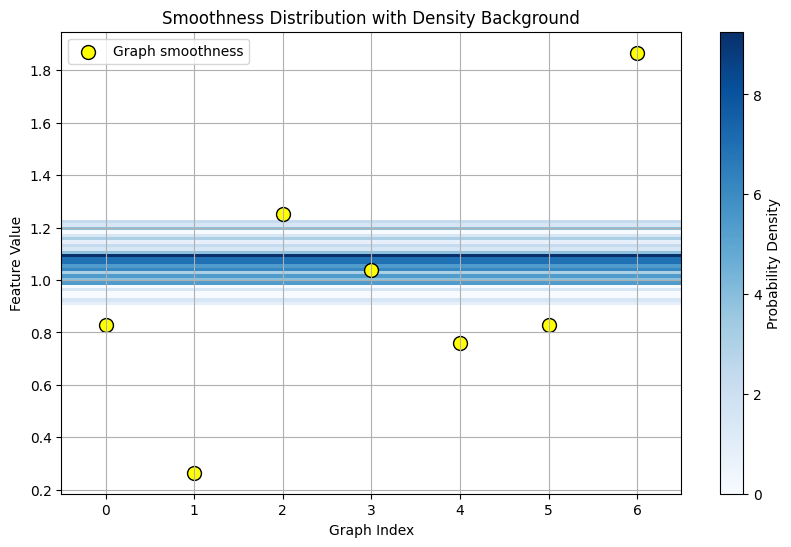

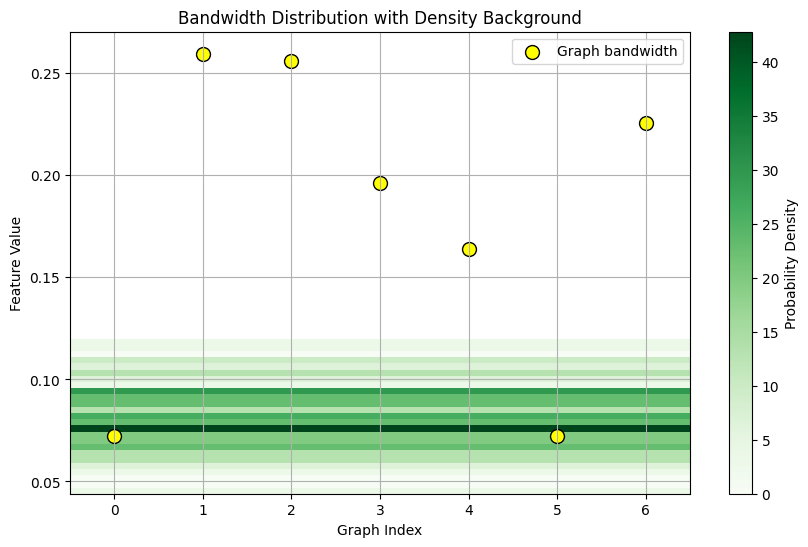

In [50]:
from matplotlib.colors import Normalize

def plot_density_background_with_features(feature_values, density_values, density_x, title="Feature Distribution with Density Background", color = 'Blues',  label='Graph Features'):
    """
    Plots a probability density background with points representing graph feature values.
    
    Args:
        feature_values (list or np.array): Values of features for the graphs.
        density_values (list or np.array): Values of the probability density function.
        density_x (list or np.array): X-axis values corresponding to the density values.
        title (str): Title of the plot.
    """
    # Normalize the density values using Matplotlib's Normalize
    norm = Normalize(vmin=np.min(density_values), vmax=np.max(density_values))
    
    plt.figure(figsize=(10, 6))

    # Create a meshgrid for plotting
    X, Y = np.meshgrid(np.arange(len(feature_values)), density_x)

    # Plot the colormap using the normalized density values
    c = plt.pcolormesh(X, Y, np.tile(density_values, (len(feature_values), 1)).T, cmap=color, shading='auto', norm=norm)

    # Add a colorbar based on the same normalization
    plt.colorbar(c, label="Probability Density")

    # Plot points (graph index on x-axis and feature value on y-axis)
    plt.scatter(range(len(feature_values)), feature_values, color='yellow', edgecolor='black', s=100, label= label)
    
    # Title and labels
    plt.title(title)
    plt.xlabel("Graph Index")
    plt.ylabel("Feature Value")
    plt.grid(True)
    plt.legend()
    plt.show()
Lmean_smoothness_real_graph =  [0.82664174, 0.26497587, 1.25155388, 1.03987941, 0.75981887, 0.82664174,1.86694081]
Lmean_bandwidth_real_graph =  [0.07224739, 0.25951061, 0.25604572, 0.19609114, 0.16405223, 0.07224739  ,0.22556137]

plot_density_background_with_features(Lmean_smoothness_real_graph, Lhist_smoothness, bins_smoothness, title="Smoothness Distribution with Density Background", color = 'Blues', label = 'Graph smoothness')  
plot_density_background_with_features(Lmean_bandwidth_real_graph, Lhist_bandwidth, bins_bandwidth, title="Bandwidth Distribution with Density Background", color = 'Greens', label = 'Graph bandwidth')


# 4. Test of the Series Analyzer

### plot filtered signal + plot fit model on signal + plot AE fit

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


  0%|          | 0/1 [00:00<?, ?it/s]

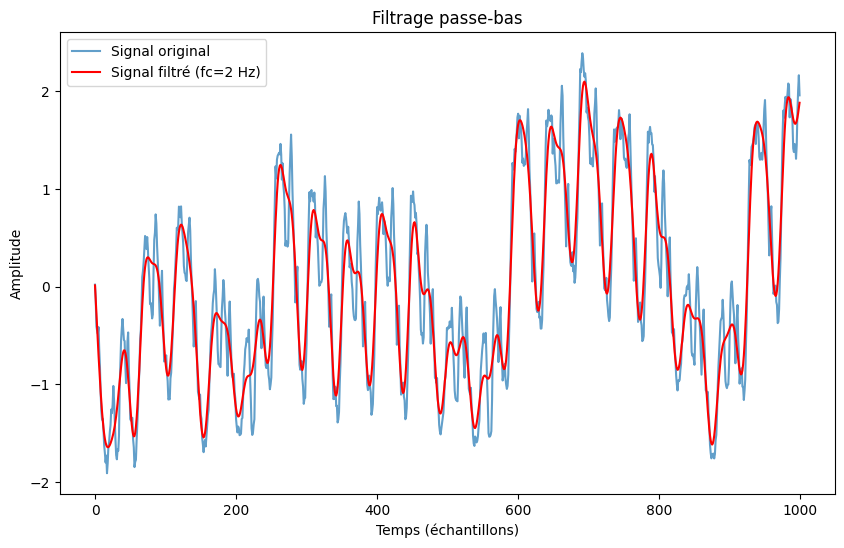

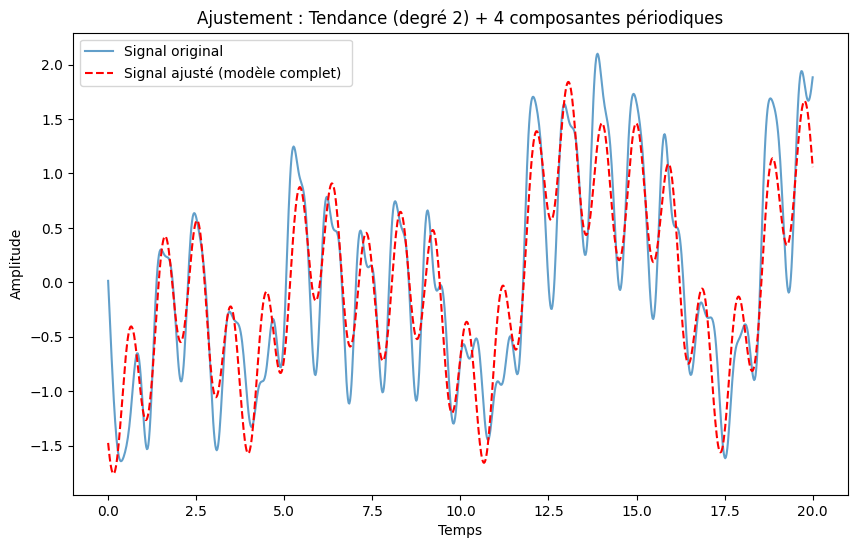

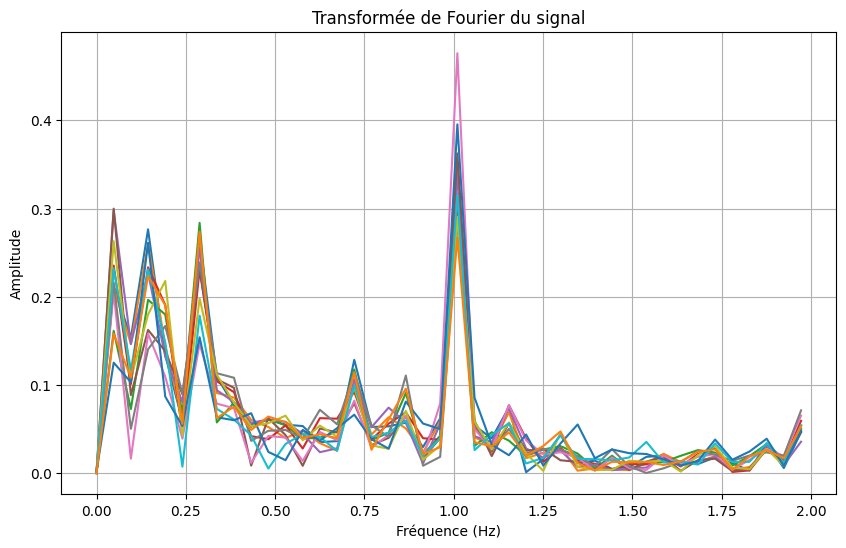

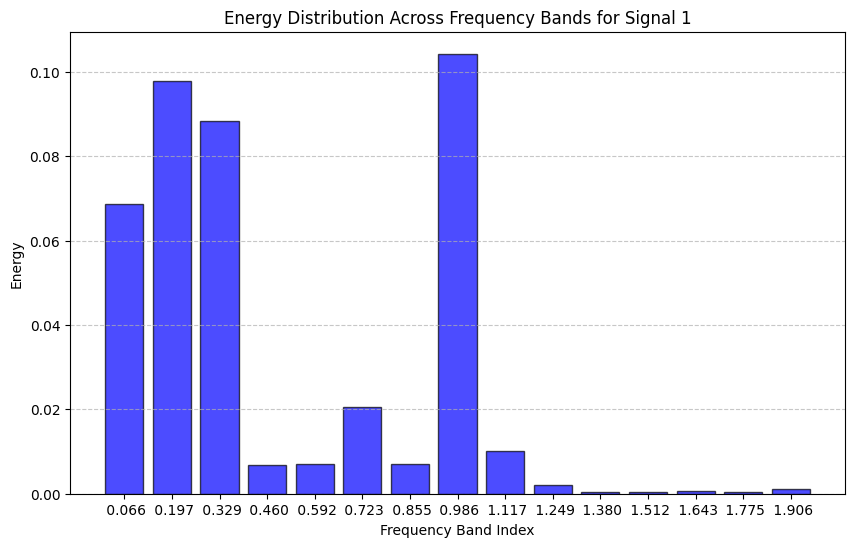

c:\Users\zehav\OneDrive\Bureau\ENS\S5_ARIA\stage_3mois_graph\Projet_github\Projet\Final_code\graph_series_analyzer.py:546: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mode

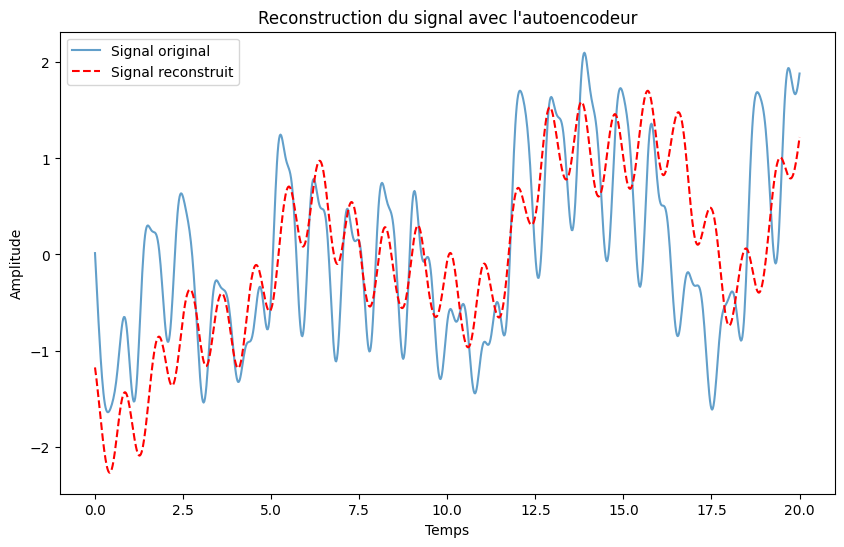

100%|██████████| 1/1 [00:01<00:00,  1.92s/it]


In [113]:
%load_ext autoreload
%autoreload 2

from graph_series_analyzer import GraphSeriesAnalyzer
import torch
import torch.nn as nn
from AE_class import Autoencoder
from AE_class_distance import SignalAutoEncoder
from tqdm import tqdm


signals_test = generer_signal_aleatoire(type_signal="sin + trend", frequence=0.5, amplitude=1.0,rand=0.2, bruit=0.0, nsize=1000, nnodes = 12, Fe=48)

nodes_features = data.nodes_dataframe
name_column = "load"
nsize = 1000
row = 0*48 * 30 * 7
cutoff_freq = 2
AE_path = "AE_model.pth"

Lsmoothness_model = []
Lsmoothness_fft = []
Lsmoothness_AE = []
Lparams_model = []
# Test the GraphSeriesAnalyzer class
for i in tqdm(range(1)):
    graph_series = GraphSeriesAnalyzer(dictGraphs["Graphs" + str(i)] , nodes_features, name_column, nsize, row,  AE_path,cutoff_freq=cutoff_freq, test= False, signals_test = signals_test, plot_result = True, **df_pos)
    Lsmoothness_model.append(graph_series.smoothness_model)
    Lsmoothness_fft.append(graph_series.smoothness_fft)
    Lsmoothness_AE.append(graph_series.smoothness_AE)
    Lparams_model.append(graph_series.params)



## 4.4.1 plot the features on random graphes

In [117]:
%load_ext autoreload
%autoreload 2
from graph_builder import GraphBuilder
#Genration of random graphs
LdictGraphs = []
for n in range(len(L_path_to_W)) :
    dictGraphs = {}
    for i in range(400) :
        Graph = GraphBuilder(L_path_to_W[n], test=True, **df_pos)
        W = Graph.W
        dictGraphs["Graphs"+str(i)] = Graph
    LdictGraphs.append(dictGraphs)


    
LdictGraphs_vrai = []
dictGraphs = {}
for n in range(len(L_path_to_W)) :
    Graph = GraphBuilder(L_path_to_W[n], test=False, **df_pos)
    W = Graph.W 
    dictGraphs["Graphs" + str(n)] = Graph
    
LdictGraphs_vrai.append(dictGraphs)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [118]:
%load_ext autoreload
%autoreload 2
from graph_scalar_analyzer import GraphScalarAnalyzer
from tqdm import tqdm

nodes_features = data.nodes_dataframe
name_column = "load"
row = 0
plot_curv = False

def calcul_dictfeatures_series(LdictGraphs, nodes_features = data.nodes_dataframe, name_column = "load", cutoff_freq = 2 ,row = 0,Nsize= 48, plot_curv = False, test = False ,signals_test=None, Fast = False):
    dictfeaturesGraphs = {}
    indexdict = 0
    for dictGraphs in LdictGraphs:
        Lsmoothness_model = []
        Lsmoothness_fft = []
        Lsmoothness_AE = []
        Lparams_model = []
        Lbandwidth = []
        Lbandwidth_std = []
        # Test the GraphSeriesAnalyzer class
        for i in tqdm(range(len(dictGraphs))):
            graph_series = GraphSeriesAnalyzer(dictGraphs["Graphs" + str(i)] , nodes_features, name_column, nsize, row,  AE_path,cutoff_freq=cutoff_freq, test= test, signals_test = signals_test, plot_result = plot_curv, **df_pos)
            Lsmoothness_model.append(graph_series.smoothness_model)
            Lsmoothness_fft.append(graph_series.smoothness_fft)
            Lsmoothness_AE.append(graph_series.smoothness_AE)
            Lparams_model.append(graph_series.params)
            Lbandwidth.append(graph_series.bandwidth)
            Lbandwidth_std.append(graph_series.bandwidth_std)

        x = np.arange(len(Lsmoothness_model))
        # Créer une figure avec 3 sous-graphiques (3 lignes, 1 colonne)
        fig, axs = plt.subplots(5, 1, figsize=(10, 18))  # Taille ajustée pour plus de clarté

        # Premier graphique : Smoothness avec trend + periodicité
        axs[0].scatter(x, Lsmoothness_model, color='mediumblue', label='Points', s=100)
        axs[0].set_xlabel('Graph index')
        axs[0].set_ylabel('Smoothness avec trend + periodicité')
        axs[0].set_title('Smoothness with trend + periodicity')
        axs[0].grid(True, linestyle='--', alpha=0.6)
        axs[0].legend()

        # Deuxième graphique : Smoothness avec FFT
        axs[1].scatter(x, Lsmoothness_fft, color='r', label='Points', s=100)
        axs[1].set_xlabel('Graph index')
        axs[1].set_ylabel('Smoothness avec FFT')
        axs[1].set_title('Smoothness with FFT')
        axs[1].grid(True, linestyle='--', alpha=0.6)
        axs[1].legend()

        # Troisième graphique : Smoothness avec AE
        axs[2].scatter(x, Lsmoothness_AE, color='green', label='Points', s=100)
        axs[2].set_xlabel('Graph index')
        axs[2].set_ylabel('Smoothness avec AE')
        axs[2].set_title('Smoothness with AE')
        axs[2].grid(True, linestyle='--', alpha=0.6)
        axs[2].legend()

        # Quatrième graphique : Bandwidth
        axs[3].scatter(x, Lbandwidth, color='purple', label='Points', s=100)
        axs[3].set_xlabel('Graph index')
        axs[3].set_ylabel('Bandwidth')
        axs[3].set_title('Bandwidth')
        axs[3].grid(True, linestyle='--', alpha=0.6)
        axs[3].legend()
        
        # Cinquième graphique : Bandwidth std
        axs[4].scatter(x, Lbandwidth_std, color='orange', label='Points', s=100)
        axs[4].set_xlabel('Graph index')
        axs[4].set_ylabel('Bandwidth std')
        axs[4].set_title('Bandwidth std')
        axs[4].grid(True, linestyle='--', alpha=0.6)
        axs[4].legend()
        
        # Ajuster l'espacement entre les sous-graphiques
        plt.tight_layout()

        # Afficher tous les graphiques à la fin
        plt.show()
        
        
        
        dictfeaturesGraphs["Graphs"+str(indexdict)] = [Lsmoothness_AE, Lsmoothness_fft, Lsmoothness_model, Lparams_model, Lbandwidth, Lbandwidth_std]
        indexdict += 1
        print(indexdict)
    return dictfeaturesGraphs

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


100%|██████████| 400/400 [07:30<00:00,  1.13s/it]


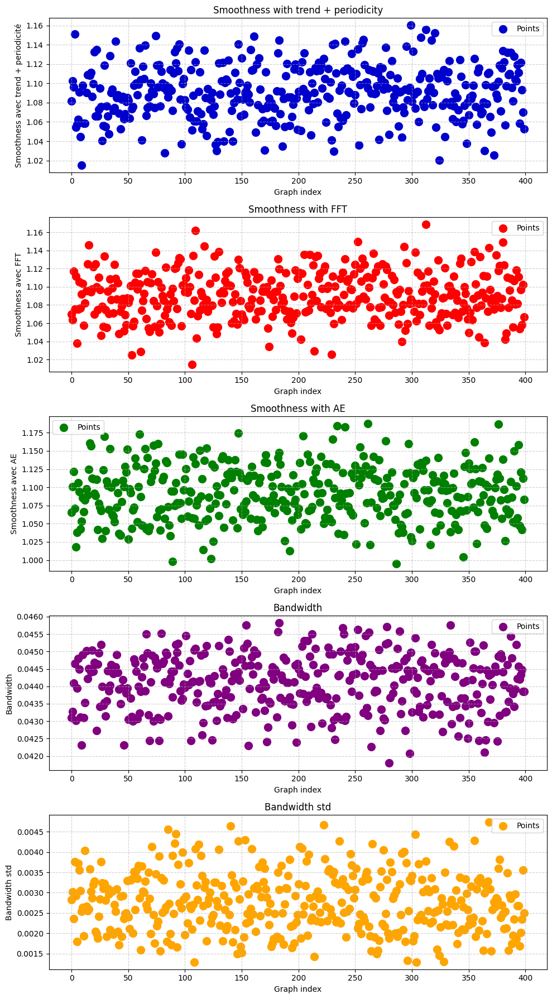

1


100%|██████████| 400/400 [07:50<00:00,  1.18s/it]


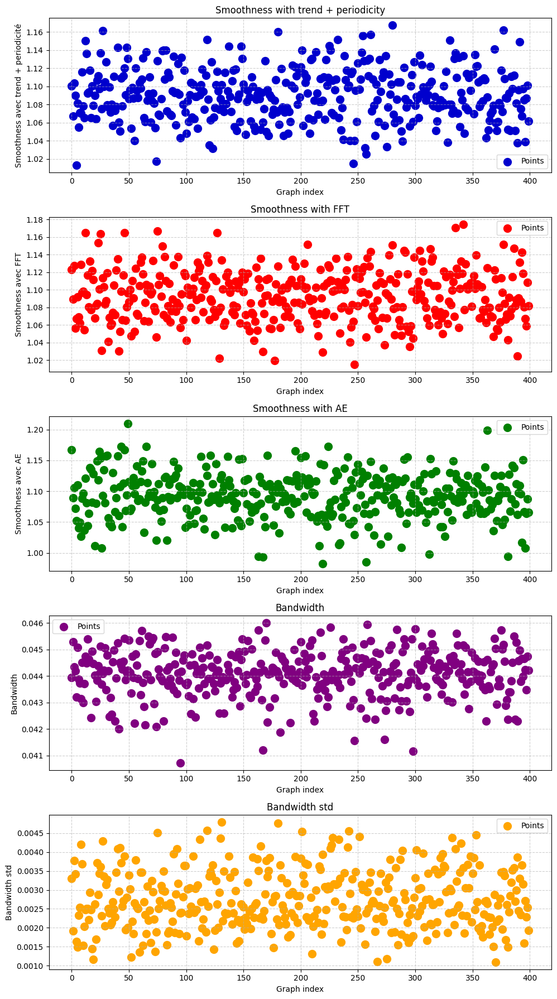

2


100%|██████████| 400/400 [07:34<00:00,  1.14s/it]


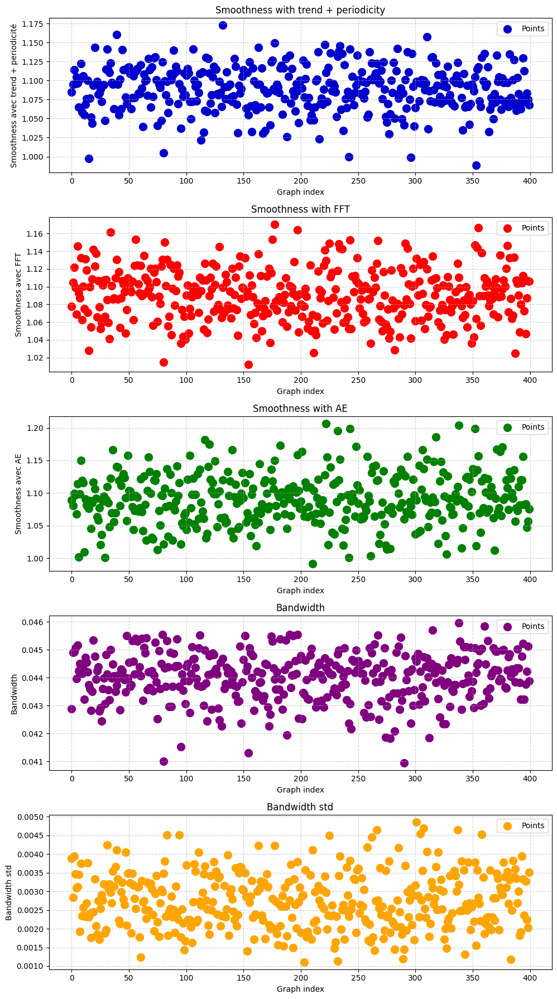

3


100%|██████████| 400/400 [07:12<00:00,  1.08s/it]


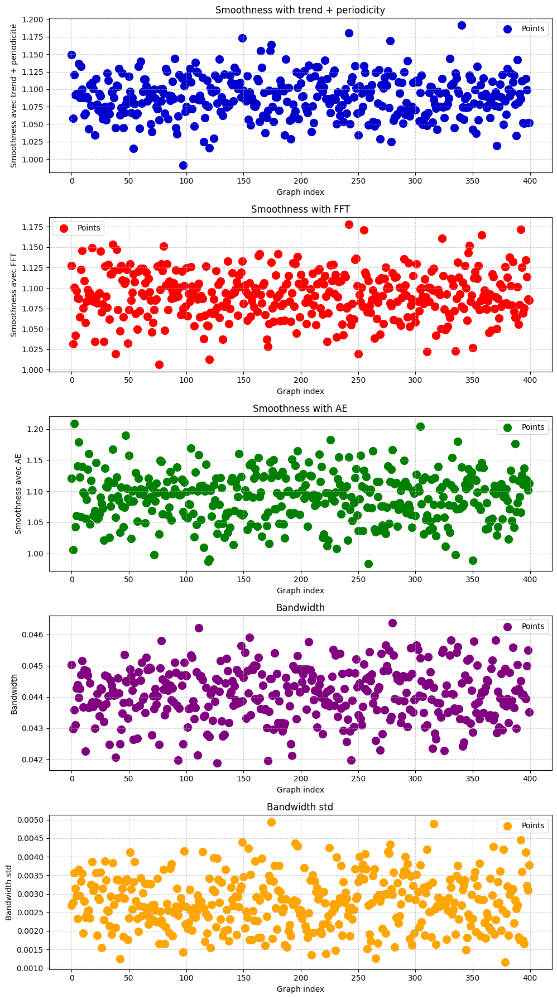

4


100%|██████████| 400/400 [07:29<00:00,  1.12s/it]


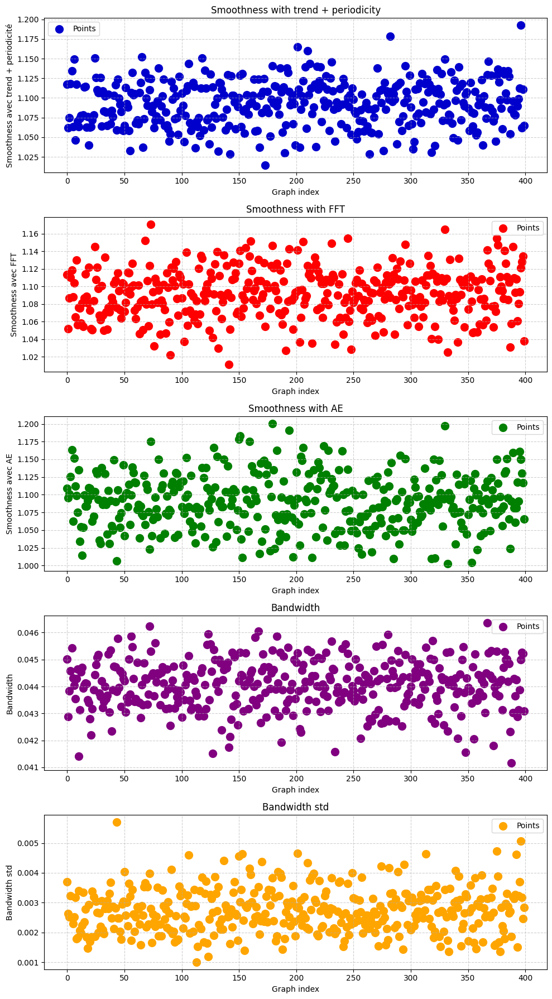

5


100%|██████████| 400/400 [07:30<00:00,  1.13s/it]


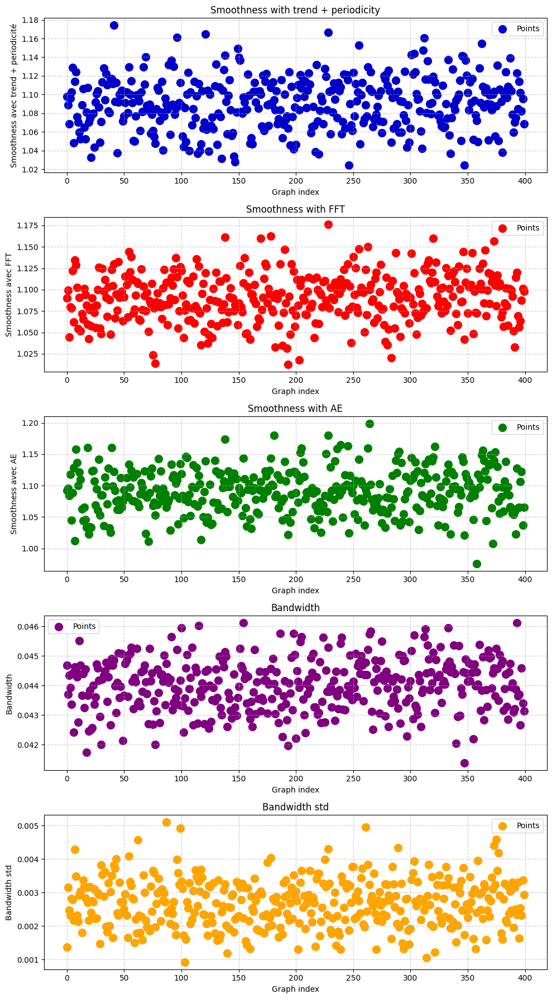

6


100%|██████████| 400/400 [07:25<00:00,  1.11s/it]


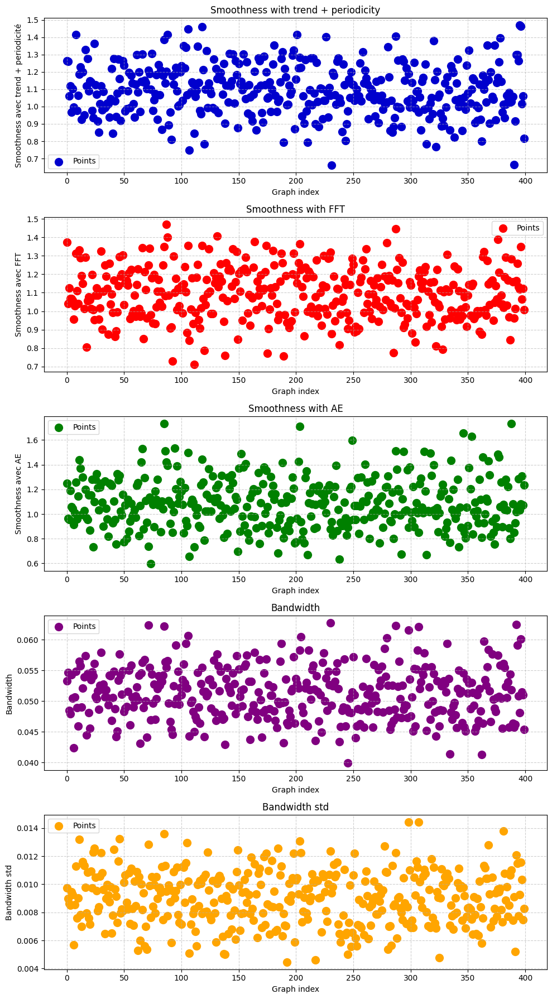

7


100%|██████████| 7/7 [00:07<00:00,  1.13s/it]


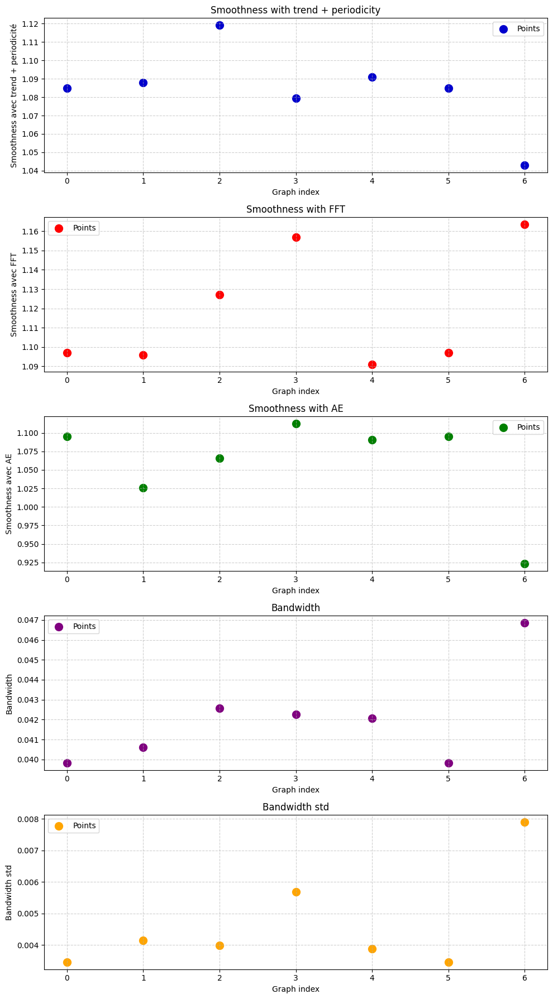

1


In [119]:
dictfeaturesGraphs=calcul_dictfeatures_series(LdictGraphs, nodes_features = data.nodes_dataframe, name_column = "load", cutoff_freq = 2 ,row = 0,Nsize= 1000, plot_curv = False, test = False ,signals_test=None, Fast = False)
dictfeaturesGraphs_vrai=calcul_dictfeatures_series(LdictGraphs_vrai, nodes_features = data.nodes_dataframe, name_column = "load", cutoff_freq = 2 ,row = 0,Nsize= 1000, plot_curv = False, test = False ,signals_test=None, Fast = False)

## 4.3 plot the correlation between the features of each method of metrics

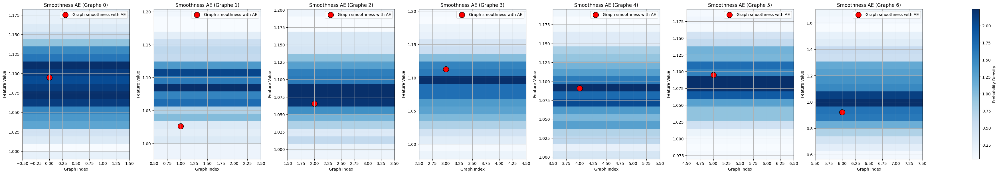

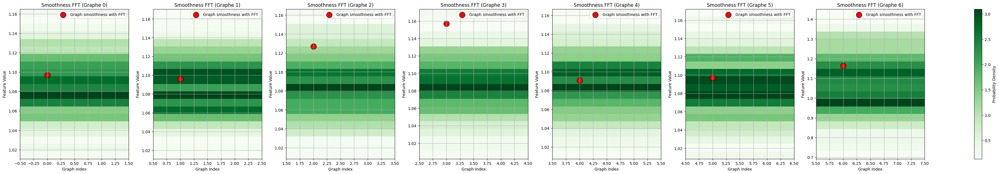

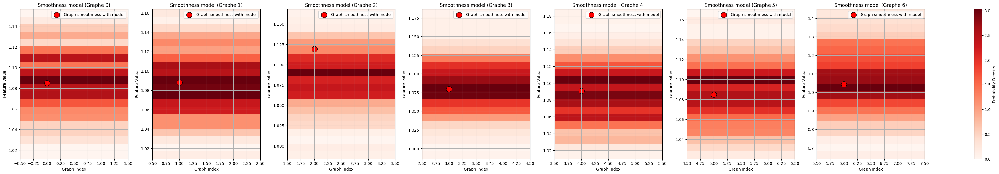

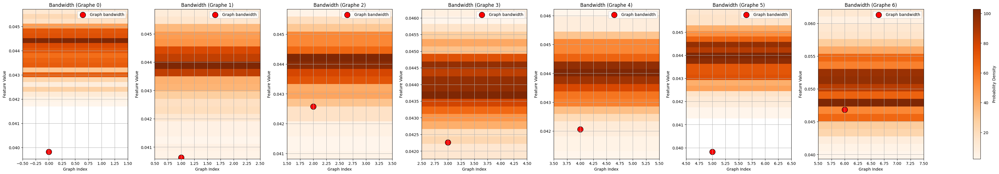

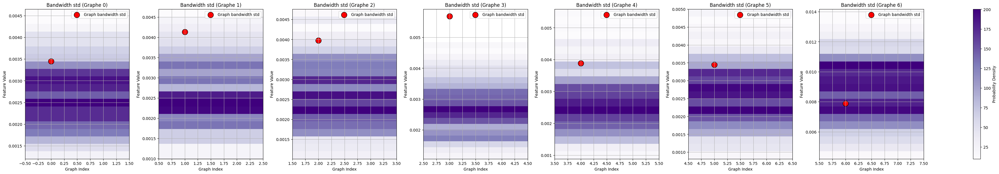

In [130]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

def distribution_calcul(L, nbrange):
    """
    Calculate the probability distribution of a list.

    Args:
    - L (list or np.array): List of values.
    - nbrange (int): Number of bins for the histogram.

    Returns:
    - Lhist (np.array): Normalized histogram of the distribution.
    - bins (np.array): Bin edges.
    """
    bins = np.linspace(min(L), max(L), nbrange + 1)
    hist, _ = np.histogram(L, bins=bins, density=True)
    return hist, bins[:-1]

def plot_distribution(Lhist, bins, title, xlabel, ylabel, color):
    """
    Plot a probability distribution as a histogram.

    Args:
    - Lhist (list or np.array): Values of the distribution.
    - bins (list or np.array): Bin edges corresponding to the distribution.
    - title (str): Title of the plot.
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - color (str): Color of the histogram.
    """
    plt.figure(figsize=(10, 6))
    plt.bar(bins, Lhist, width=(bins[1] - bins[0]), color=color, alpha=0.7)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()

def plot_features_on_distribution(feature_values, density_values, density_x, title="Feature Distribution with Graph Points", xlabel="Feature Value", ylabel="Probability Density"):
    """
    Plots a probability density function with points representing graph feature values, showing the index of each graph.

    Args:
        feature_values (list or np.array): Values of features for the graphs to be plotted as points.
        density_values (list or np.array): Values of the probability density function.
        density_x (list or np.array): X-axis values corresponding to the density values.
        title (str): Title of the plot.
        xlabel (str): Label for the x-axis.
        ylabel (str): Label for the y-axis.
    """
    plt.figure(figsize=(10, 6))

    # Plot the density curve
    plt.plot(density_x, density_values, label="Probability Density", color='blue')

    # Plot the feature points with their graph index
    for idx, value in enumerate(feature_values):
        plt.scatter(value, np.interp(value, density_x, density_values),
                    color='red', s=100, edgecolor='black', label=f"Graph {idx+1}" if idx == 0 else "", zorder=3)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_density_background_with_multiple_features(feature_values_list, density_values_list, Ldensity_x, color='Blues', title="Feature Distribution with Density Background", label='graph smoothness'):
    """
    Plots a probability density background for each feature value with a subplot for each feature.

    Args:
        feature_values_list (list or np.array): List of feature values for the graphs.
        density_values_list (list or np.array): List of the probability density function values for each feature.
        Ldensity_x (list or np.array): List of X-axis values corresponding to the density values for each feature.
        color (str): Colormap for the density background.
        title (str): Title of the plot.
        label (str): Label for the points plotted.
    """
    num_features = len(feature_values_list)
    fig, axes = plt.subplots(1, num_features, figsize=(5 * num_features, 6), constrained_layout=True)

    for i, (feature_values, density_values, density_x) in enumerate(zip(feature_values_list, density_values_list, Ldensity_x)):
        ax = axes[i] if num_features > 1 else axes

        # Normalize the density values using Matplotlib's Normalize
        norm = Normalize(vmin=np.min(density_values), vmax=np.max(density_values))

        # Create a meshgrid for plotting
        X, Y = np.meshgrid(np.array([i, i+1]), density_x)
        C = np.tile(density_values, (2,1)).T
        # print('desnsity_values',density_values)
        # print('X',X)
        # print('Y',Y)
        # print('C',C)
        # Plot the colormap using the normalized density values
        c = ax.pcolormesh(X, Y, C, cmap=color, shading='auto', norm=norm)

        # Add the feature point on top of the density background
        ax.scatter(i , feature_values, color='red', edgecolor='black', s=200, label=label)

        # Titles, labels, and legends for each subplot
        ax.set_title(f"{title} (Graphe {i })")
        ax.set_xlabel("Graph Index")
        ax.set_ylabel("Feature Value")
        ax.grid(True)
        ax.legend()

    # Add a colorbar common to all subplots
    fig.colorbar(c, ax=axes, orientation='vertical', label="Probability Density")
    plt.show()

def real_graph_on_density_series(dictfeaturesGraphs, dictfeaturesGraphs_vrai, nbrange = 3 ):
    
    Lmean_smoothness_model = []
    Lmean_smoothness_fft = []
    Lmean_smoothness_AE = []
    Lbandwidth = []
    Lbandwidth_std = []
    
    Lhist_smoothness_model = []
    Lhist_smoothness_fft = []
    Lhist_smoothness_AE = []
    Lhist_bandwidth = []
    Lhist_bandwidth_std = []
    
    Lbins_smoothness_model = []
    Lbins_smoothness_fft = []
    Lbins_smoothness_AE = []
    Lbins_bandwidth = []
    Lbins_bandwidth_std = []
    
    # We are taking back the list of the features of the graphs
    for i in range(len(dictfeaturesGraphs)):
        Lmean_smoothness_AE.append(dictfeaturesGraphs["Graphs"+str(i)][0])
        Lmean_smoothness_fft.append(dictfeaturesGraphs["Graphs"+str(i)][1])
        Lmean_smoothness_model.append(dictfeaturesGraphs["Graphs"+str(i)][2])
        Lbandwidth.append(dictfeaturesGraphs["Graphs"+str(i)][4])
        Lbandwidth_std.append(dictfeaturesGraphs["Graphs"+str(i)][5])
        
        hist_smoothness_model, bins_smoothness_model = distribution_calcul(Lmean_smoothness_model[i], nbrange)
        hist_smoothness_fft, bins_smoothness_fft = distribution_calcul(Lmean_smoothness_fft[i], nbrange)
        hist_smoothness_AE, bins_smoothness_AE = distribution_calcul(Lmean_smoothness_AE[i], nbrange)
        hist_bandwidth, bins_bandwidth = distribution_calcul(Lbandwidth[i], nbrange)
        hist_bandwidth_std, bins_bandwidth_std = distribution_calcul(Lbandwidth_std[i], nbrange)
        
        Lhist_smoothness_model.append(hist_smoothness_model)
        Lhist_smoothness_fft.append(hist_smoothness_fft)
        Lhist_smoothness_AE.append(hist_smoothness_AE)
        Lhist_bandwidth.append(hist_bandwidth)
        Lhist_bandwidth_std.append(hist_bandwidth_std)
        
        Lbins_smoothness_model.append(bins_smoothness_model)
        Lbins_smoothness_fft.append(bins_smoothness_fft)
        Lbins_smoothness_AE.append(bins_smoothness_AE)
        Lbins_bandwidth.append(bins_bandwidth)
        Lbins_bandwidth_std.append(bins_bandwidth_std)
        
        
    Lmean_smoothness_AE = np.array(Lmean_smoothness_AE)
    Lmean_smoothness_fft = np.array(Lmean_smoothness_fft)
    Lmean_smoothness_model = np.array(Lmean_smoothness_model)
    Lbandwidth = np.array(Lbandwidth)
    Lbandwidth_std = np.array(Lbandwidth_std)
    
    Lhist_smoothness_model = np.array(Lhist_smoothness_model)
    Lhist_smoothness_fft = np.array(Lhist_smoothness_fft)
    Lhist_smoothness_AE = np.array(Lhist_smoothness_AE)
    Lhist_bandwidth = np.array(Lhist_bandwidth)
    Lhist_bandwidth_std = np.array(Lhist_bandwidth_std)
    
    Lbins_smoothness_model = np.array(Lbins_smoothness_model)
    Lbins_smoothness_fft = np.array(Lbins_smoothness_fft)
    Lbins_smoothness_AE = np.array(Lbins_smoothness_AE)
    Lbins_bandwidth = np.array(Lbins_bandwidth)
    Lbins_bandwidth_std = np.array(Lbins_bandwidth_std)


    
    
    # We are taking back the list of the features of the real graph
    for i in range(len(dictfeaturesGraphs_vrai)):
        Lmean_smoothness_AE_real_graph = dictfeaturesGraphs_vrai["Graphs"+str(i)][0]
        Lmean_smoothness_fft_real_graph = dictfeaturesGraphs_vrai["Graphs"+str(i)][1]
        Lmean_smoothness_model_real_graph = dictfeaturesGraphs_vrai["Graphs"+str(i)][2]
        Lbandwidth_real_graph = dictfeaturesGraphs_vrai["Graphs"+str(i)][4]
        Lbandwidth_std_real_graph = dictfeaturesGraphs_vrai["Graphs"+str(i)][5]

    Lmean_smoothness_AE_real_graph = np.array(Lmean_smoothness_AE_real_graph)
    Lmean_smoothness_fft_real_graph = np.array(Lmean_smoothness_fft_real_graph)
    Lmean_smoothness_model_real_graph = np.array(Lmean_smoothness_model_real_graph)
    Lbandwidth_real_graph = np.array(Lbandwidth_real_graph)
    Lbandwidth_std_real_graph = np.array(Lbandwidth_std_real_graph)
    
    
    #we plot the distribution of the smoothness and bandwidth with the real graph value on it
    plot_density_background_with_multiple_features(Lmean_smoothness_AE_real_graph, Lhist_smoothness_AE, Lbins_smoothness_AE, title="Smoothness AE", color = 'Blues', label = 'Graph smoothness with AE')
    plot_density_background_with_multiple_features(Lmean_smoothness_fft_real_graph, Lhist_smoothness_fft, Lbins_smoothness_fft, title="Smoothness FFT", color = 'Greens', label = 'Graph smoothness with FFT')
    plot_density_background_with_multiple_features(Lmean_smoothness_model_real_graph, Lhist_smoothness_model, Lbins_smoothness_model, title="Smoothness model", color = 'Reds', label = 'Graph smoothness with model')
    plot_density_background_with_multiple_features(Lbandwidth_real_graph, Lhist_bandwidth, Lbins_bandwidth, title="Bandwidth" , color = 'Oranges', label = 'Graph bandwidth')
    plot_density_background_with_multiple_features(Lbandwidth_std_real_graph, Lhist_bandwidth_std, Lbins_bandwidth_std, title="Bandwidth std", color = 'Purples', label = 'Graph bandwidth std')

real_graph_on_density_series(dictfeaturesGraphs, dictfeaturesGraphs_vrai, nbrange = 20 )


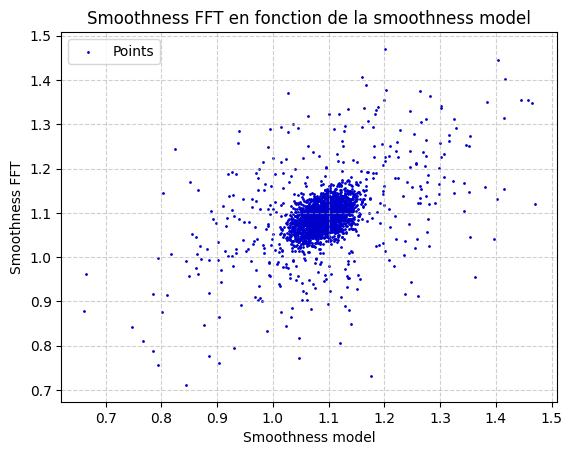

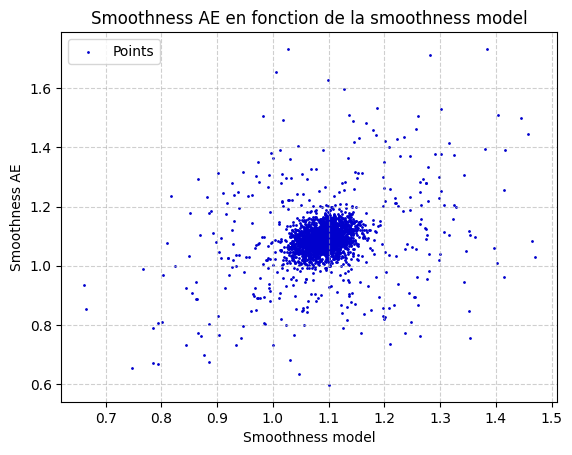

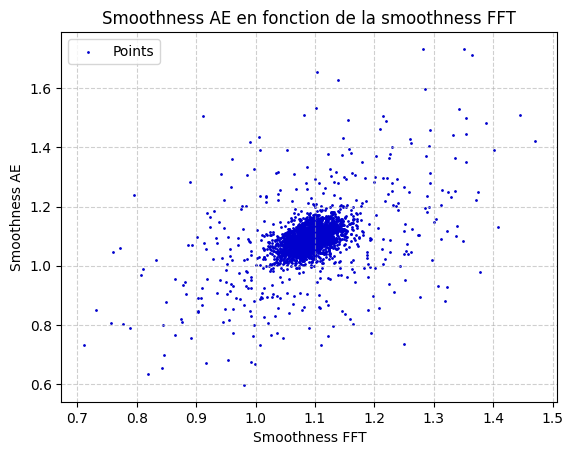

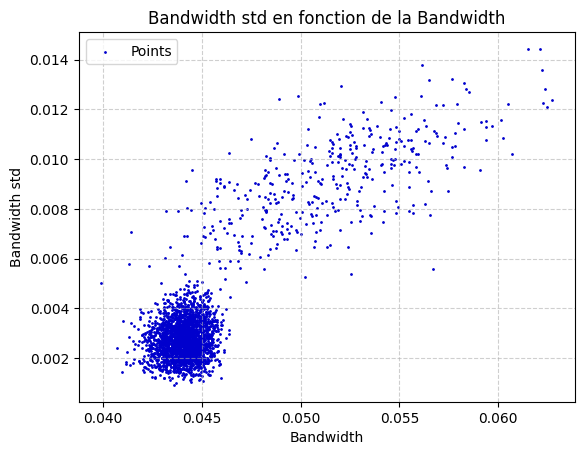

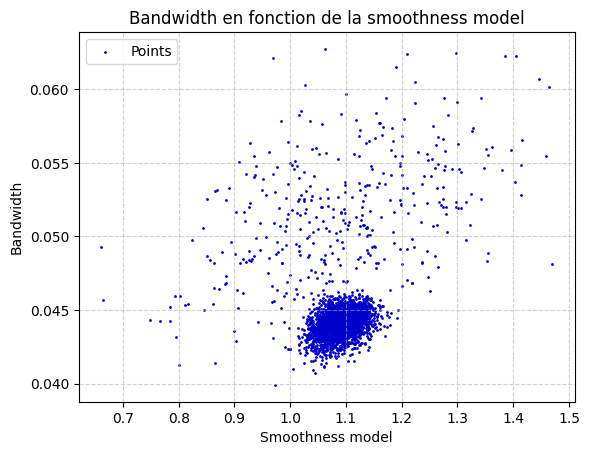

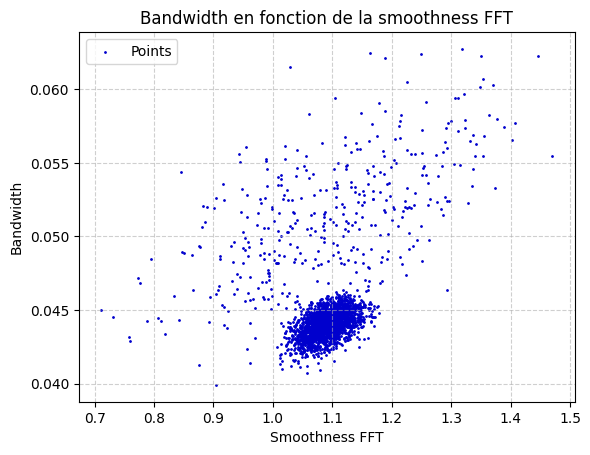

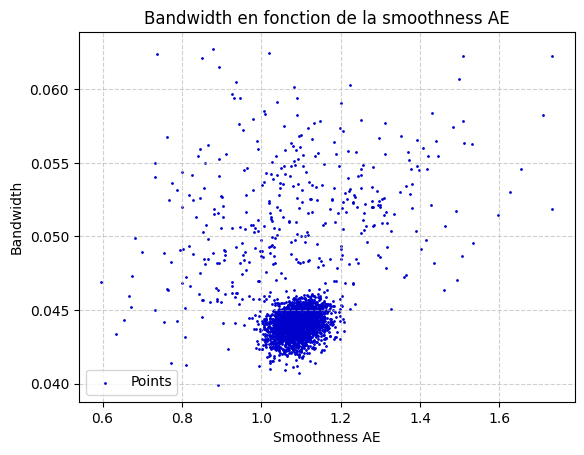

In [136]:
# affichage de la bande passante en fonction de la smoothness
def plot_correlation(Lx, Ly,xlabel, ylabel, title) : 
    plt.scatter(Lx, Ly, color='mediumblue', label='Points', s=1)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.show()


Lsmoothness_model = []
Lsmoothness_fft = []
Lsmoothness_AE = []
Lbandwidth = []
Lbandwidth_std = []
# We are taking back the list of the features of the graphs
for i in range(len(dictfeaturesGraphs)):
    Lsmoothness_model.append(dictfeaturesGraphs["Graphs"+str(i)][2])
    Lsmoothness_fft.append(dictfeaturesGraphs["Graphs"+str(i)][1])
    Lsmoothness_AE.append(dictfeaturesGraphs["Graphs"+str(i)][0])
    Lbandwidth.append(dictfeaturesGraphs["Graphs"+str(i)][4])
    Lbandwidth_std.append(dictfeaturesGraphs["Graphs"+str(i)][5])
    


plot_correlation(Lsmoothness_model, Lsmoothness_fft, "Smoothness model", "Smoothness FFT", "Smoothness FFT en fonction de la smoothness model")
plot_correlation(Lsmoothness_model, Lsmoothness_AE, "Smoothness model", "Smoothness AE", "Smoothness AE en fonction de la smoothness model")
plot_correlation(Lsmoothness_fft, Lsmoothness_AE, "Smoothness FFT", "Smoothness AE", "Smoothness AE en fonction de la smoothness FFT")
plot_correlation(Lbandwidth, Lbandwidth_std, "Bandwidth", "Bandwidth std", "Bandwidth std en fonction de la Bandwidth")
plot_correlation(Lsmoothness_model, Lbandwidth, "Smoothness model", "Bandwidth", "Bandwidth en fonction de la smoothness model")
plot_correlation(Lsmoothness_fft, Lbandwidth, "Smoothness FFT", "Bandwidth", "Bandwidth en fonction de la smoothness FFT")
plot_correlation(Lsmoothness_AE, Lbandwidth, "Smoothness AE", "Bandwidth", "Bandwidth en fonction de la smoothness AE")

(60, 12, 15)
(12, 15)
(15,)
[-7.97413205e-01  1.09834738e-01 -2.25435783e-03  4.46902842e-01
  1.11445947e-01 -3.14159265e+00  5.75739776e-01  1.55330333e-01
 -9.70255796e-01  4.28607673e-01  2.95156630e-01  2.12621011e+00
  6.06681386e-01  1.04481145e+00  2.14437404e+00]
[-0.96812729  0.16333489 -0.00498548  0.33867838  0.11001651 -3.14159265
  0.5800974   0.15492152 -1.00463454  0.4190606   0.29614603  1.96477248
  0.66507537  1.04445787  2.15659143]
[-7.09730087e-01  8.46011290e-02 -1.01743953e-03  4.06029214e-01
  1.45543761e-01 -1.85437946e-03  3.06578331e-01  1.85297176e-01
  2.57108520e+00  4.62659619e-01  2.97274249e-01  1.82239262e+00
  5.92153371e-01  1.04756417e+00  1.97720345e+00]
[-7.88846816e-01  1.02034542e-01 -1.73098545e-03  4.34515409e-01
  1.38392096e-01 -1.03864758e+00  4.01743465e-01  2.22343461e-01
  1.39169533e+00  4.74876252e-01  5.81899938e-01  1.91972090e+00
  5.05239840e-01  1.39230408e+00  1.65745175e+00]
[0.36591027 0.0871927  0.00391362 0.10205803 0.019081

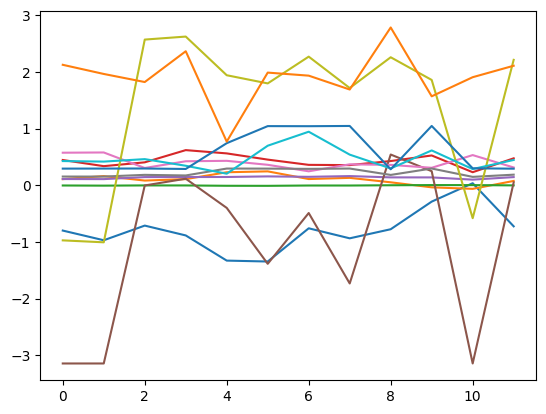

In [39]:
Lparams_model = np.array(Lparams_model)
print(Lparams_model.shape)
#on moyenne par features 
Lparams_model_reshape = Lparams_model[0,:,:]
print(Lparams_model_reshape.shape)
Lmean_params = np.mean(Lparams_model_reshape, axis = 0)
Lstd_params = np.std(Lparams_model_reshape, axis = 0)
print(Lmean_params.shape)
for i in range(12) : 
    plt.plot(Lparams_model_reshape[:,i])
print(Lparams_model_reshape[0,:])
print(Lparams_model_reshape[1,:])
print(Lparams_model_reshape[2,:])
print(Lmean_params)
print(Lstd_params)